<a href="https://colab.research.google.com/github/anamunoz01/PREPROCESAMIENTO/blob/main/Practica2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PRÁCTICA 2. Práctica de tratamiento de datos con Python**

Ana Muñoz Díaz




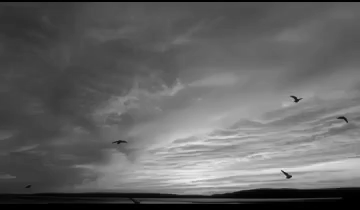

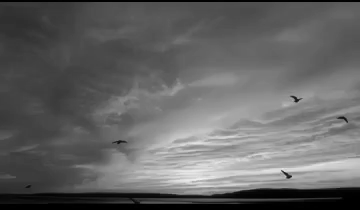

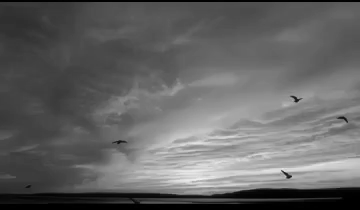

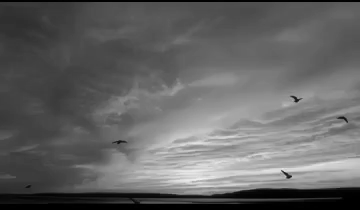

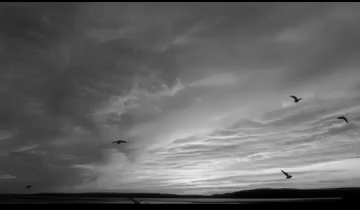

...

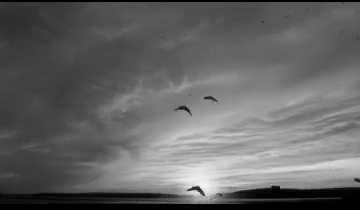

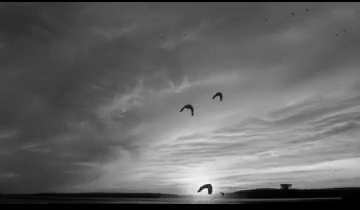

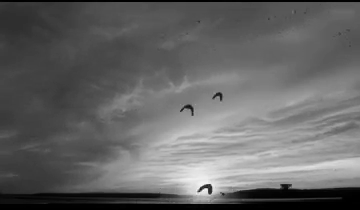

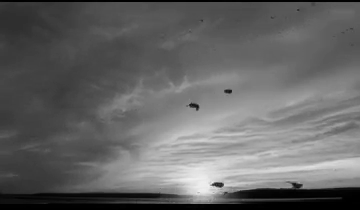

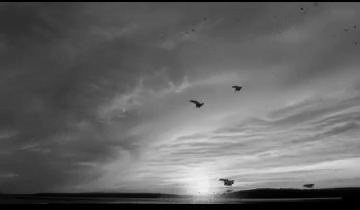

Can't receive frame (stream end?). Exiting ...


In [1]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

cap = cv.VideoCapture('videopajaros_corto.mp4')

while cap.isOpened():
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    cv2_imshow(gray)
    if cv.waitKey(1) == ord('q'):
        break

cap.release()
cv.destroyAllWindows()

In [2]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize
from IPython.display import HTML

In [4]:
def display_video(video):

  fig = plt.figure(figsize=(3,3))  #Display size specification
  
  #inicialización del  Subractor
  subtract = cv.bgsegm.createBackgroundSubtractorMOG(history=100)
  mov = []
  for i in range(len(video)):  #Append videos one by one to mov
      image=video[i]
      grey=cv.cvtColor(image,cv.COLOR_BGR2GRAY)
      blur=cv.GaussianBlur(grey,(3,3),5)
      img_sub=subtract.apply(blur)
      _,img_sub=cv.threshold(img_sub,254,255,cv.THRESH_BINARY)
      dilat=cv.dilate(img_sub,np.ones((5,5)))
      kernel=cv.getStructuringElement(cv.MORPH_ELLIPSE,(5,5))
      dilatada=cv.morphologyEx(dilat,cv.MORPH_CLOSE,kernel)
      dilatada=cv.morphologyEx(dilat,cv.MORPH_CLOSE,kernel)
      shapes,h=cv.findContours(dilatada,cv.RETR_TREE,cv.CHAIN_APPROX_SIMPLE)
      cv2_imshow(image)
      img = plt.imshow(image, animated=True)
      plt.axis('off')
      mov.append([img])
 
  #Animation creation
  anime = animation.ArtistAnimation(fig, mov, interval=50, 
  repeat_delay=1000)
  plt.close()
  return anime


In [6]:
import imageio
!pip install imageio_ffmpeg
!pip install imageio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.9 MB 1.4 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
video = imageio.mimread('videopajaros_corto.mp4',memtest=False)  #Loading 
video
#video = [resize(frame, (256, 256))[..., :3] for frame in video]    #Size adjustment (if necessary)
HTML(display_video(video).to_html5_video())  #Inline video display in HTML5

In [13]:
def display_video1(video):
    fig = plt.figure(figsize=(3,3))  #Display size specification
    subtract = cv.bgsegm.createBackgroundSubtractorMOG(history=100)
    mov = []
    for i in range(len(video)):  #Append videos one by one to mov
        image = video[i]
        gray=cv.cvtColor(image, cv.COLOR_BGR2GRAY)
        blur = cv.GaussianBlur(gray,(3,3),5)
        img_sub = subtract.apply(blur)
        dilat = cv.dilate(img_sub,np.ones((3,3)))
        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE,(5,5)) #ellipse -> 
        dilatada=cv.morphologyEx(dilat,cv.MORPH_CLOSE,kernel)
        dilatada=cv.morphologyEx(dilatada,cv.MORPH_CLOSE,kernel)

        shapes,ret=cv.findContours(dilatada,cv.RETR_TREE,cv.CHAIN_APPROX_SIMPLE) 
        #devuelve una estructura/array de formas que si ha encontrado mas de un cluster lo devuelve aqui

        for c in shapes:
          (x,y,w,h) = cv.boundingRect(c) #coordenadas de la caja que engloba el objeto
          print(x,y)
          #iscar = (w>=min_width) and (h>= min_heigth)
          #if not scar:
            #continue

          #cv.rectangle(image,(x,y), (x+y, ))

        cv2_imshow(img_sub)
        img = plt.imshow(img_sub, animated=True)
        plt.axis('off')
        mov.append([img])
        
    anime = animation.ArtistAnimation(fig, mov, interval=50, repeat_delay=1000)
    plt.close()
    return anime

    #blur para quitar detalles, queremos quitar el fondo y que deje los coches

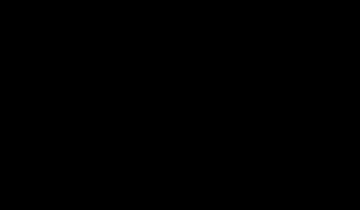

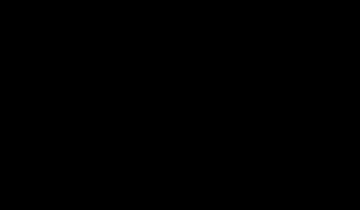

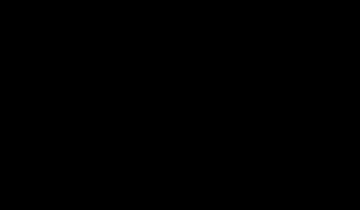

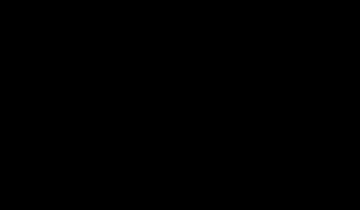

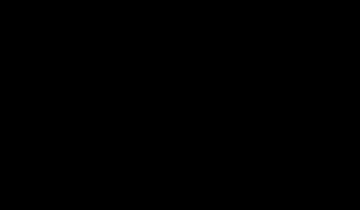

280 169
117 138
337 115
290 93


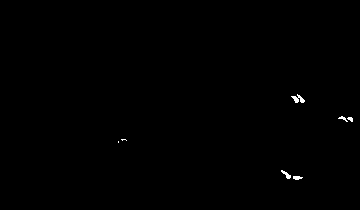

299 173
280 169
117 134
354 115
338 115
290 94


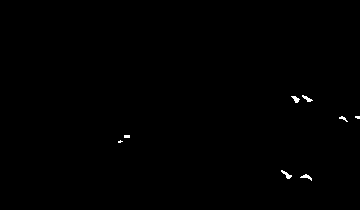

307 173
280 169
117 139
124 130
338 115
310 96
290 95


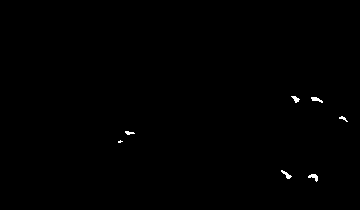

290 175
316 172
118 139
125 125
297 97
316 95


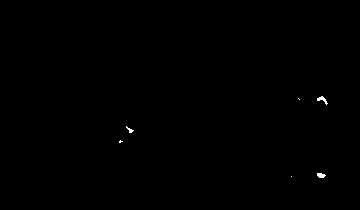

290 175
316 172
118 139
125 125
297 97
316 95


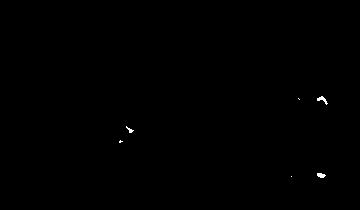

321 167
128 123
324 93


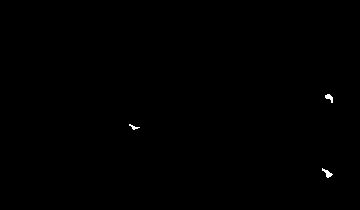

175 192
330 170
132 122
329 91


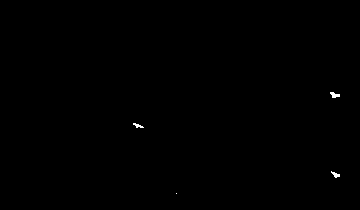

183 192
340 172
137 120
334 87


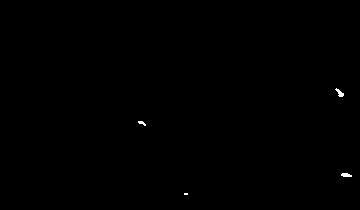

189 191
74 178
347 172
141 116
340 87


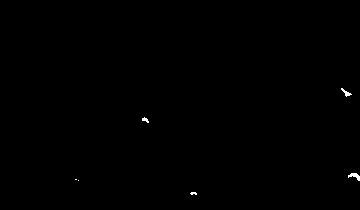

189 191
74 178
347 172
141 116
340 87


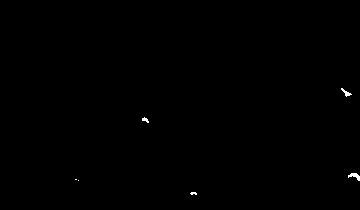

194 189
78 176
356 172
144 112
348 90


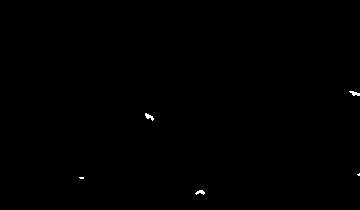

203 187
81 173
147 107


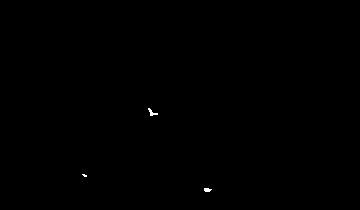

207 183
87 173
149 105


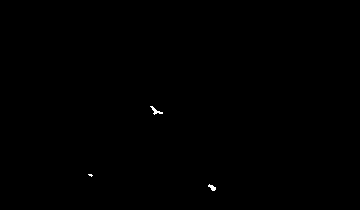

213 183
94 172
153 104


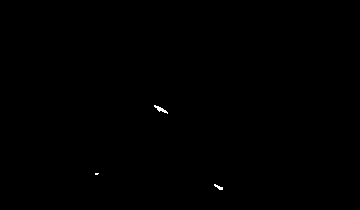

213 183
94 172
153 104


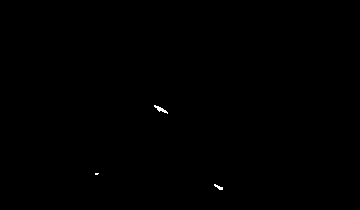

224 185
100 170
160 104


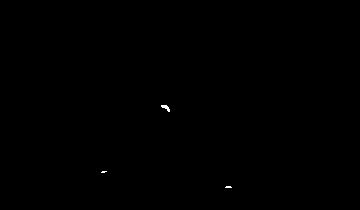

230 183
103 167
166 101


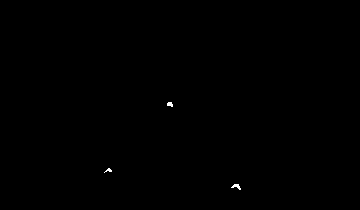

237 181
109 165
170 98


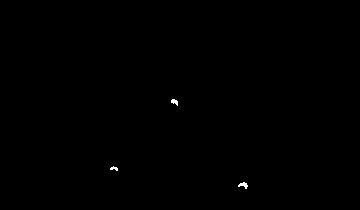

245 180
114 162
172 95


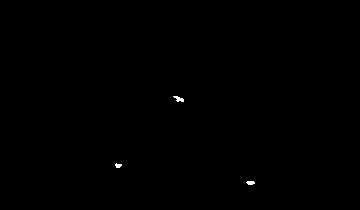

245 180
114 162
172 95


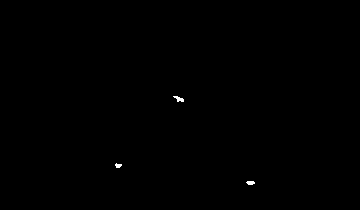

251 176
118 158
178 91


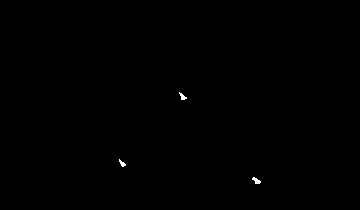

256 176
121 157
181 90


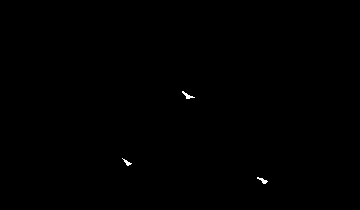

268 178
130 159
188 92


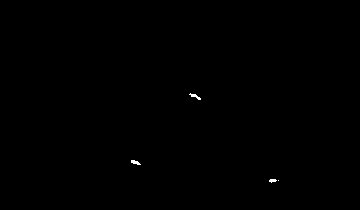

276 176
136 157
194 91


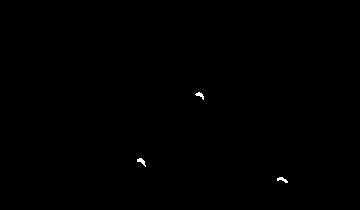

276 176
136 158
194 91


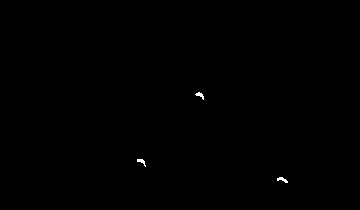

276 185
282 174
141 156
200 90


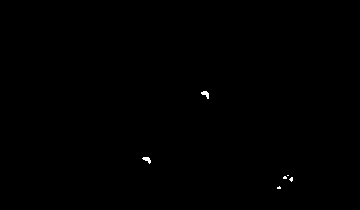

280 184
290 171
147 152
206 89


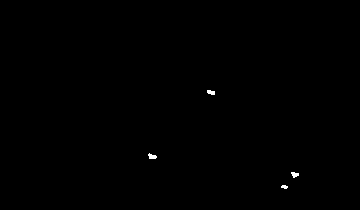

285 182
294 167
153 149
210 85


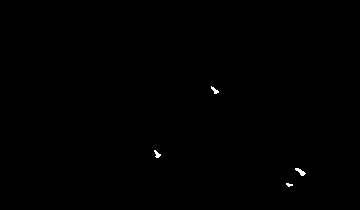

289 179
301 167
157 149
215 85


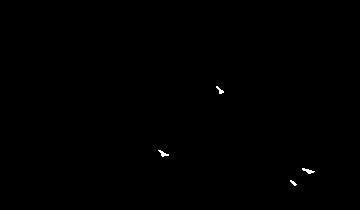

289 179
301 167
157 149
215 85


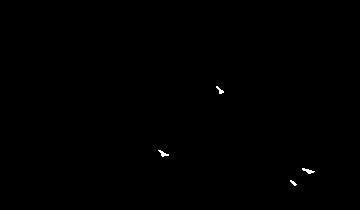

153 190
293 179
313 167
165 151
222 88


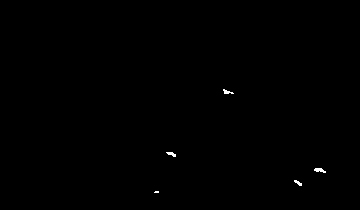

157 188
303 181
0 170
320 164
171 150
227 89


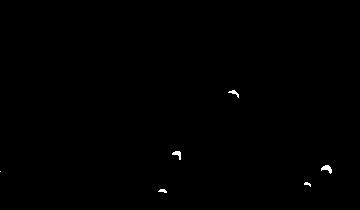

163 185
308 180
5 168
328 161
178 149
232 89


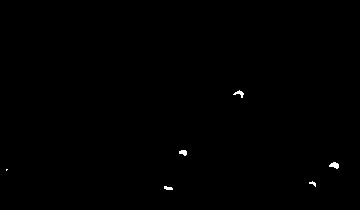

166 181
314 180
12 168
336 158
184 148
241 90


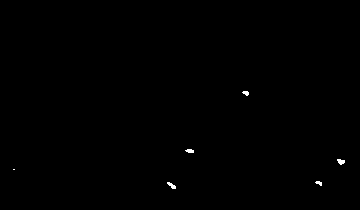

166 181
314 180
336 158
185 148
241 90


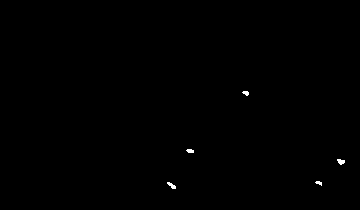

169 180
320 178
342 155
192 146
246 90


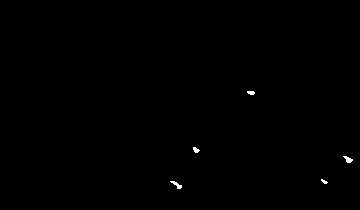

181 183
325 176
351 155
196 143
252 89


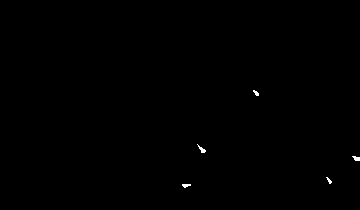

185 181
330 176
38 166
203 147
257 91


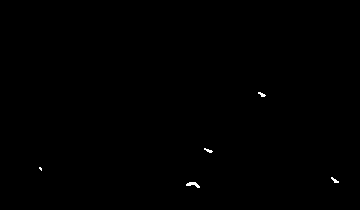

339 179
192 178
45 165
213 149
266 95


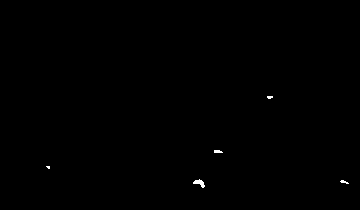

339 179
192 178
45 165
213 149
266 95


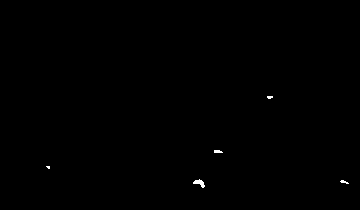

346 179
198 176
53 163
220 148
272 96


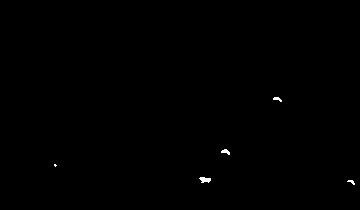

352 178
202 171
61 162
226 148
276 97


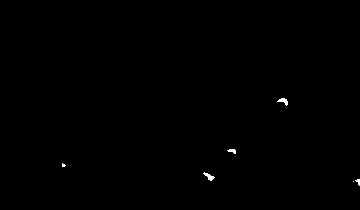

207 172
69 164
233 146
285 98


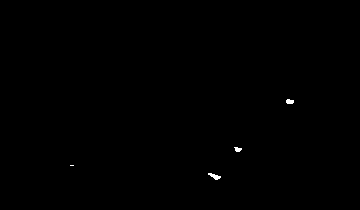

218 173
76 163
239 143
289 97


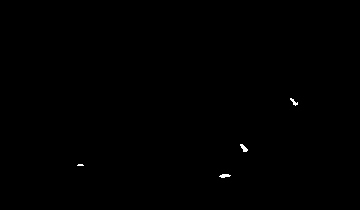

218 173
76 163
239 143
289 97


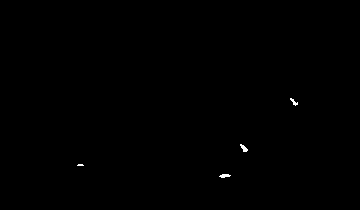

223 170
84 162
244 144
296 101


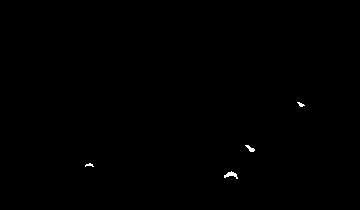

231 169
90 161
255 147
305 104


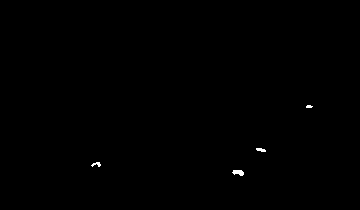

236 165
103 160
262 146
309 106


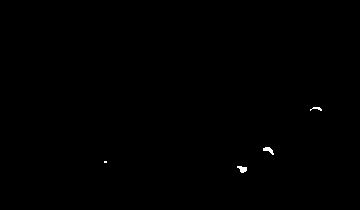

240 161
110 157
270 144
316 107


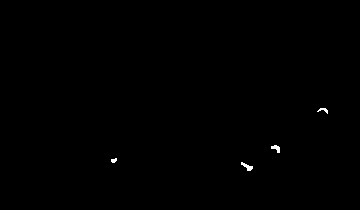

240 161
110 157
270 144
316 107


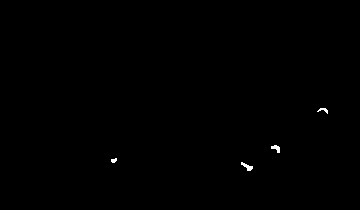

247 163
118 158
278 141
327 107


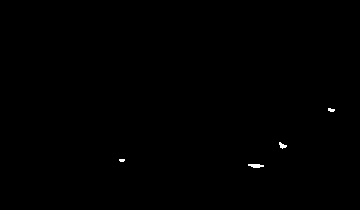

257 161
127 157
283 138
331 106


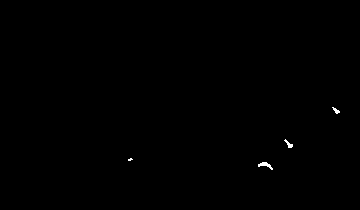

263 158
134 155
292 142
337 109


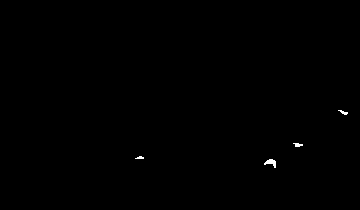

271 155
140 153
301 141
348 112


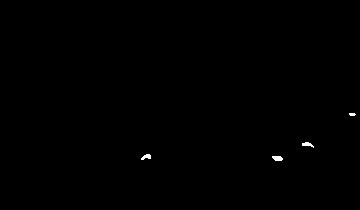

271 155
140 153
301 141
348 112


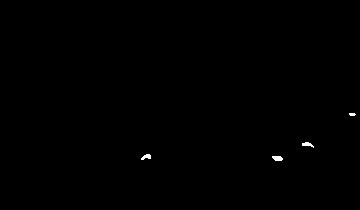

148 151
274 150
308 140
354 113


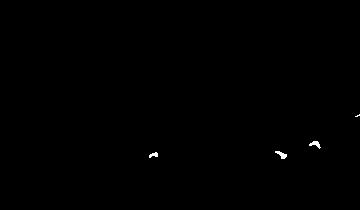

280 149
158 149
318 138


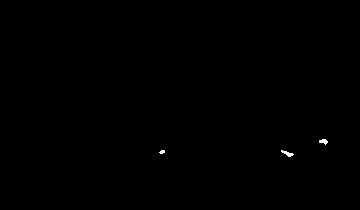

291 149
164 147
326 135


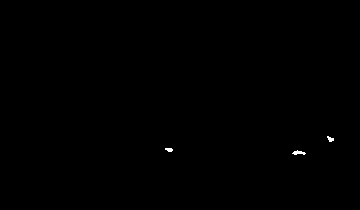

297 146
173 146
332 133


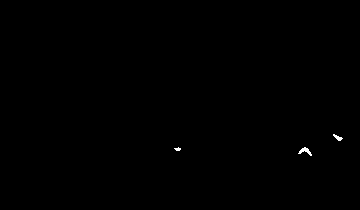

297 146
173 146
332 133


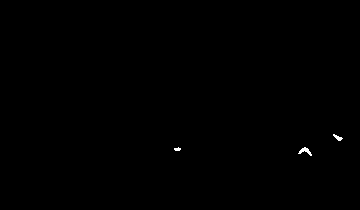

182 145
304 143
342 135


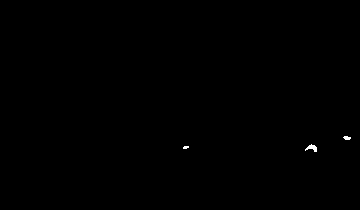

188 142
311 140
352 135


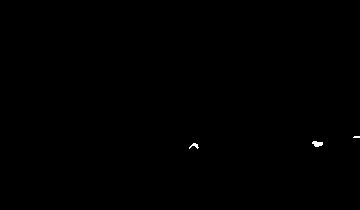

195 139
315 135


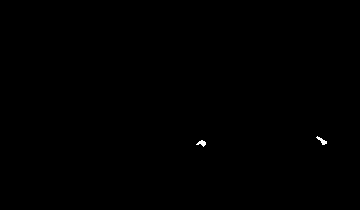

204 138
321 136


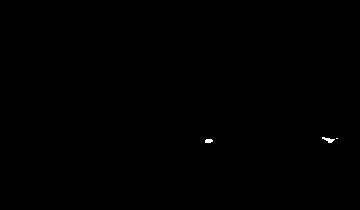

204 138
321 136


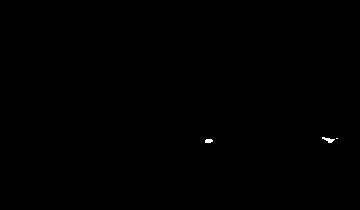

333 135
210 134


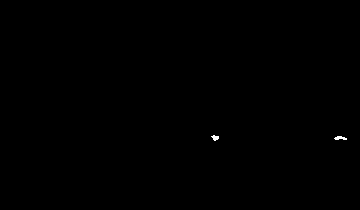

217 133
338 132


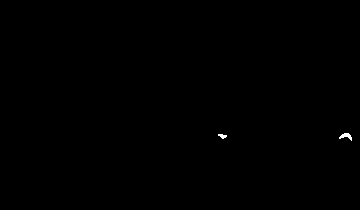

227 133
347 129


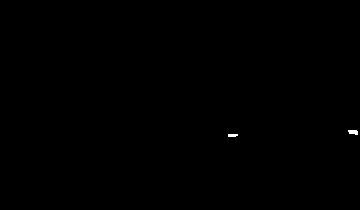

233 131
351 124


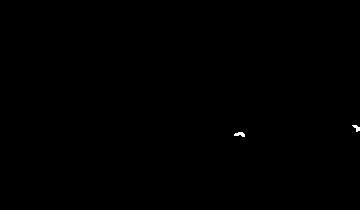

233 131
351 124


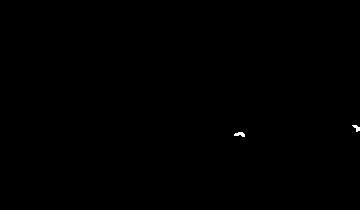

241 128
355 120


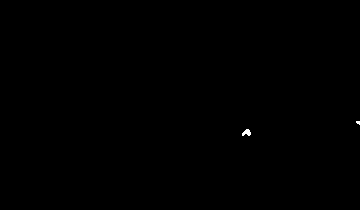

249 126


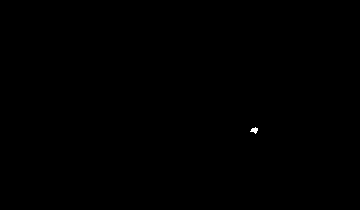

257 125


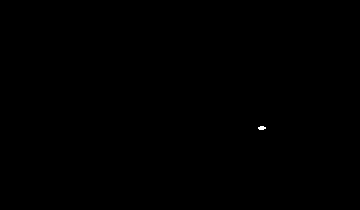

265 124


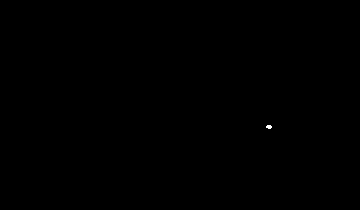

265 124


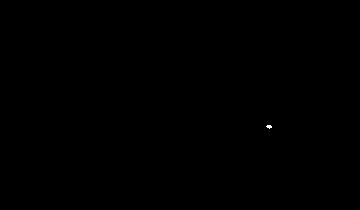

273 123


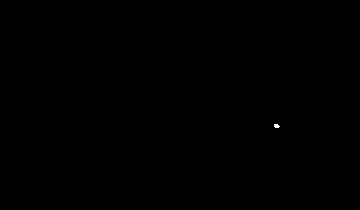

280 121


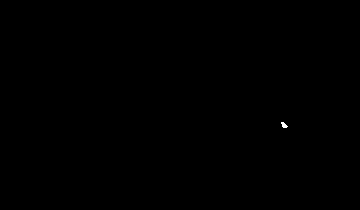

287 121


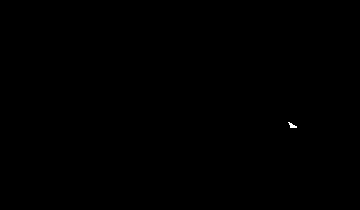

296 123


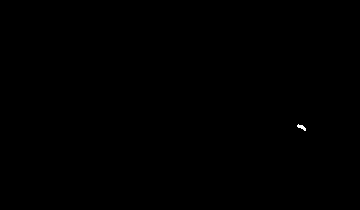

296 123


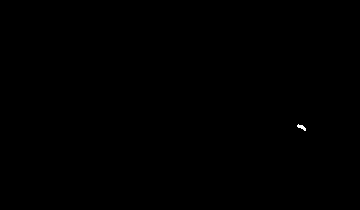

304 124


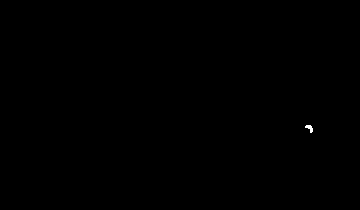

312 124


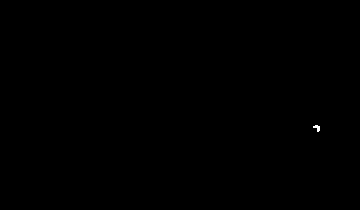

322 124


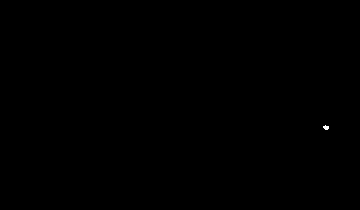

322 124


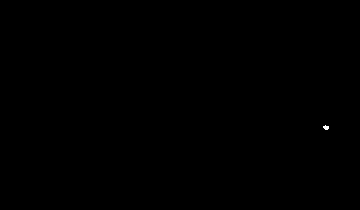

329 124


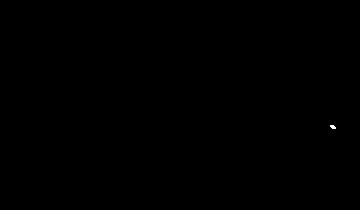

336 123


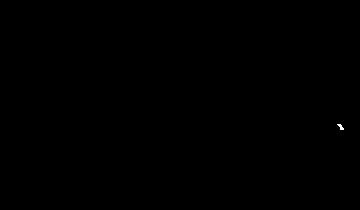

346 127


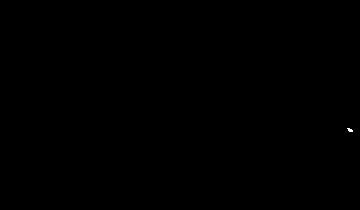

355 129


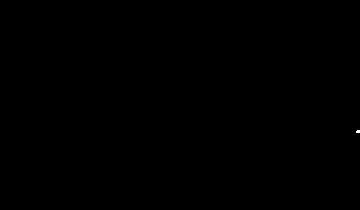

355 129


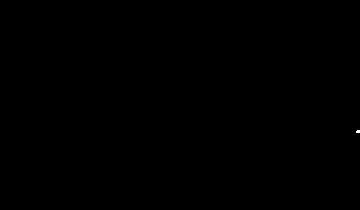

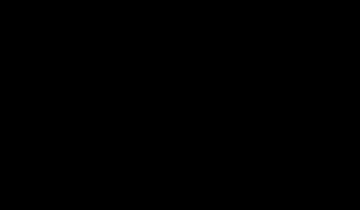

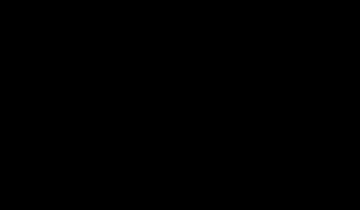

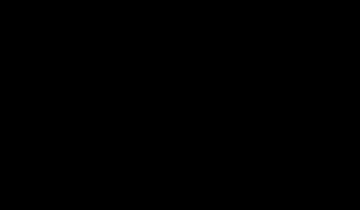

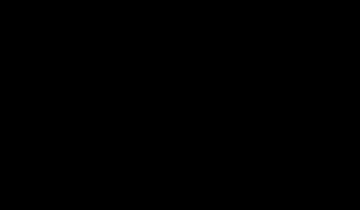

...

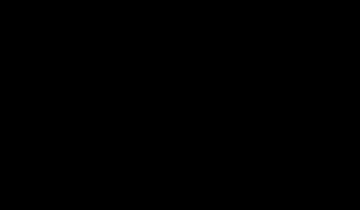

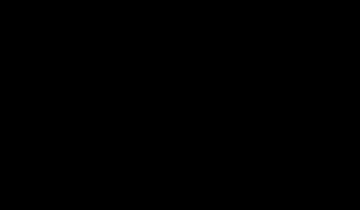

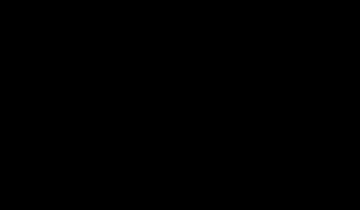

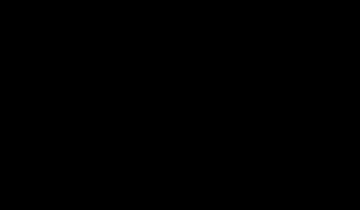

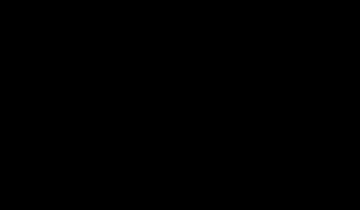

131 190
255 184


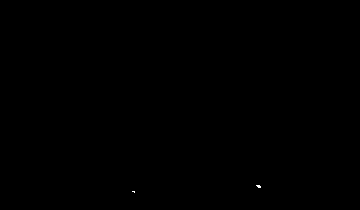

136 188
263 183


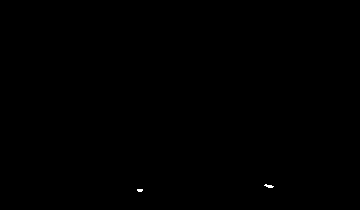

139 184
274 182


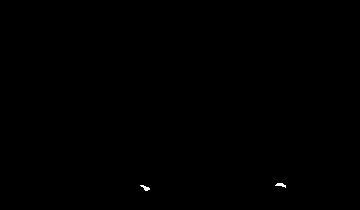

146 184
281 179


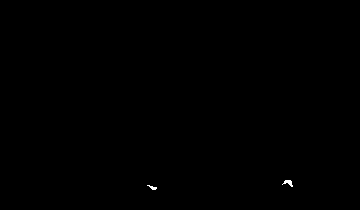

146 184
281 179


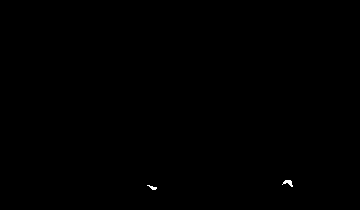

157 185
291 175


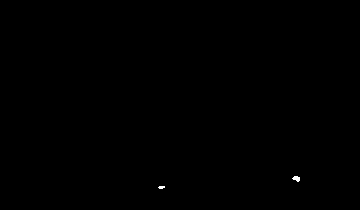

165 182
298 171


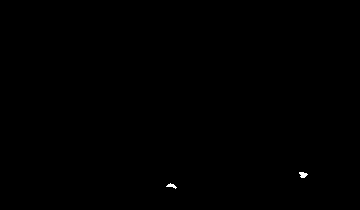

172 180
305 166


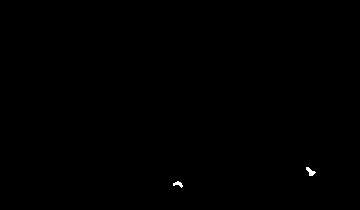

179 178
313 167


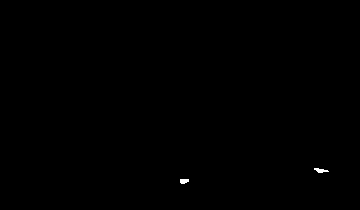

179 178
313 167


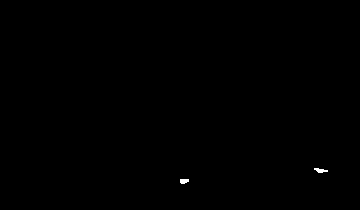

183 174
323 165


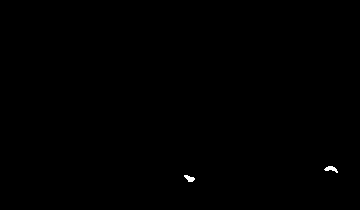

229 189
188 173
331 162


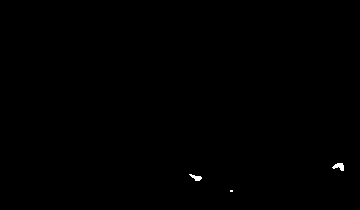

235 187
200 174
342 158


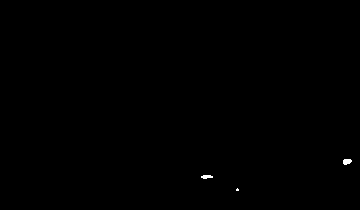

241 187
206 171
350 154


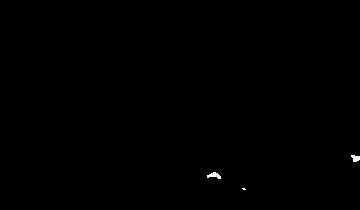

241 187
206 171
350 154


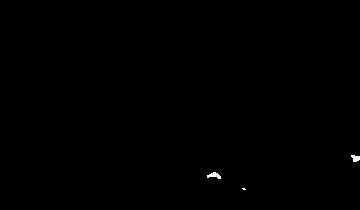

250 188
215 169
358 152


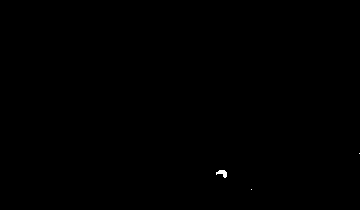

256 185
223 166


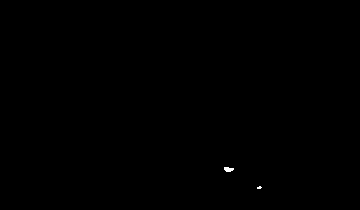

263 184
228 160


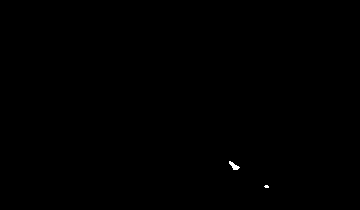

271 183
234 160


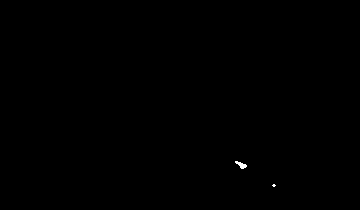

271 183
234 160


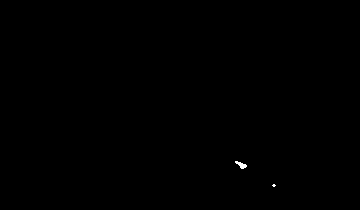

278 181
246 161


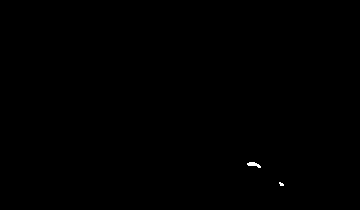

287 183
253 158


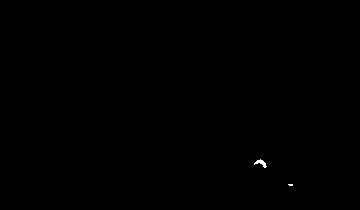

294 181
263 156


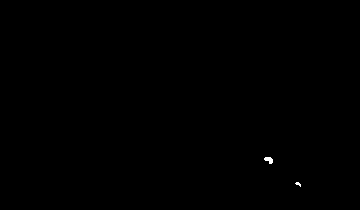

302 179
269 152


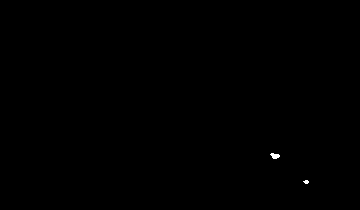

303 179
269 152


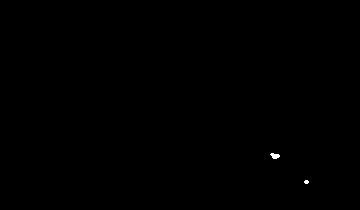

311 177
276 148


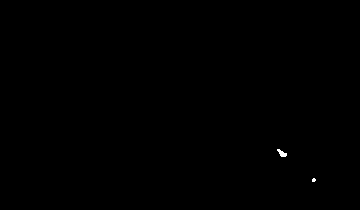

318 175
282 147


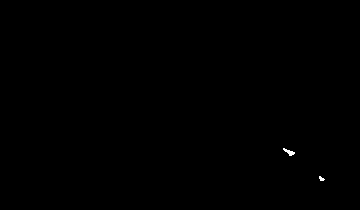

328 177
294 148


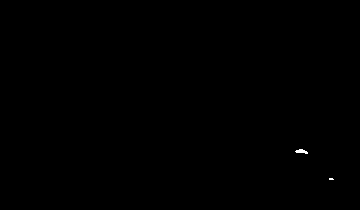

335 175
301 145


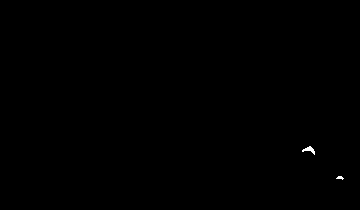

336 175
301 145


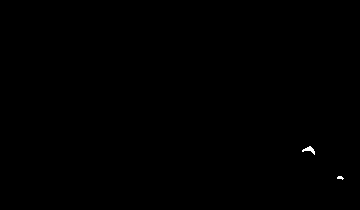

344 173
311 143


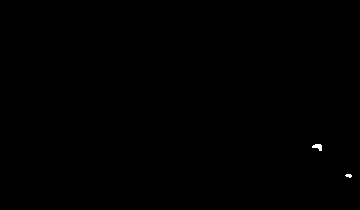

353 170
318 139


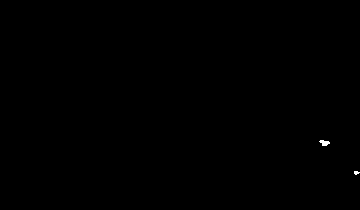

327 135


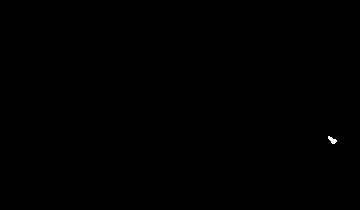

333 136


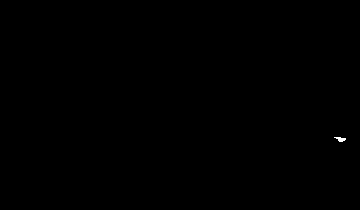

333 136


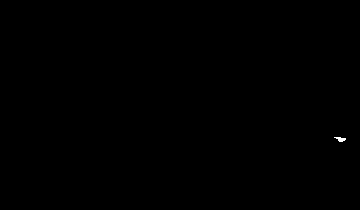

346 135


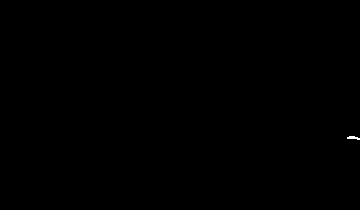

353 132


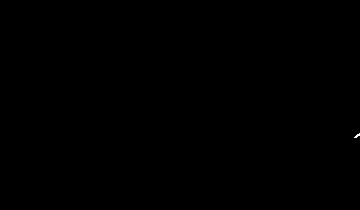

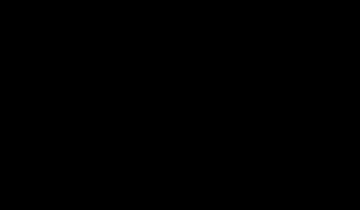

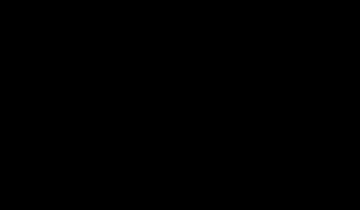

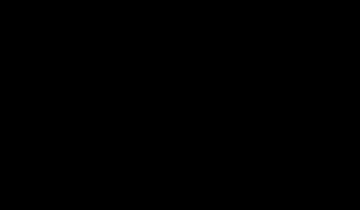

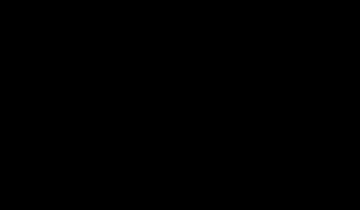

...

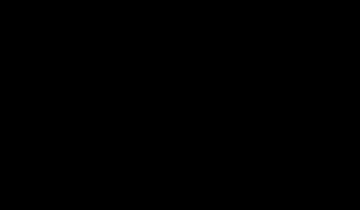

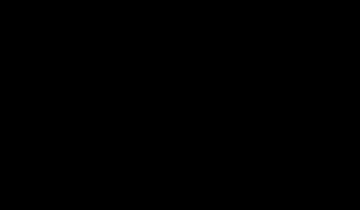

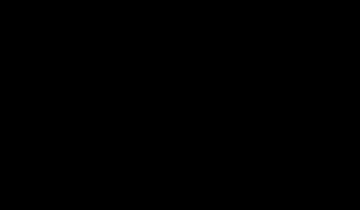

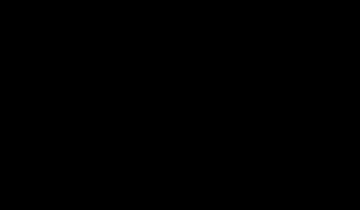

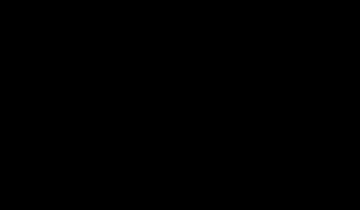

30 176


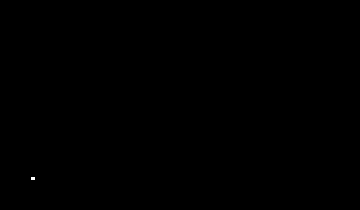

42 176


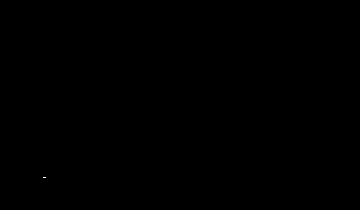

42 176


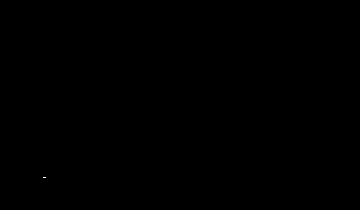

55 173


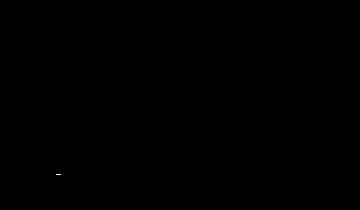

64 170


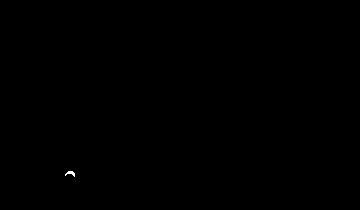

79 166


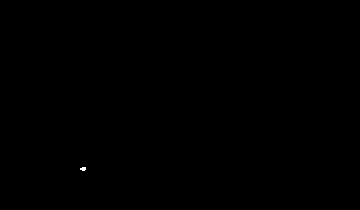

89 162


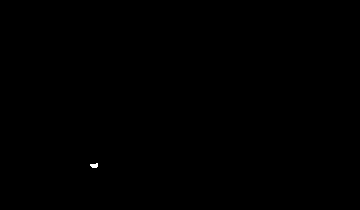

89 162


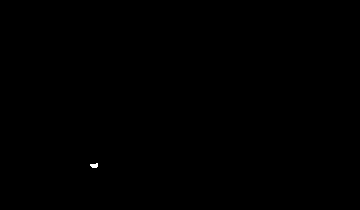

101 159


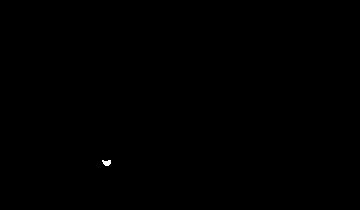

114 159


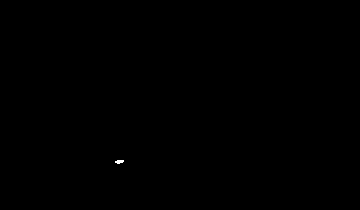

125 156


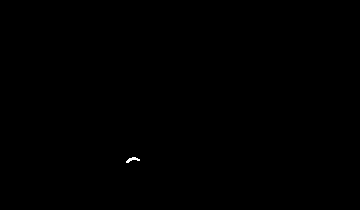

137 153


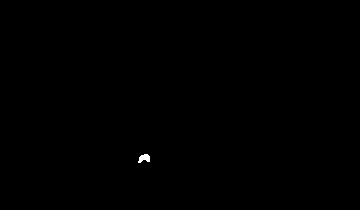

137 153


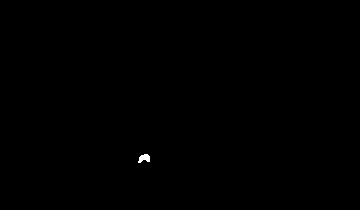

149 151


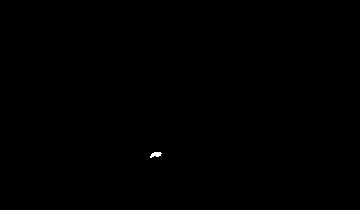

163 148


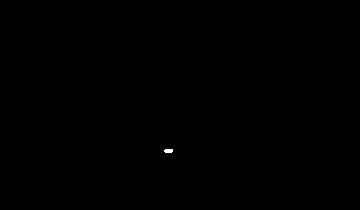

173 143


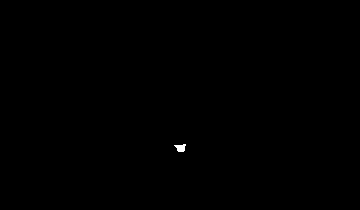

183 143


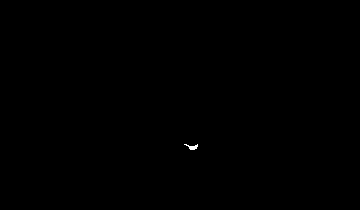

184 143


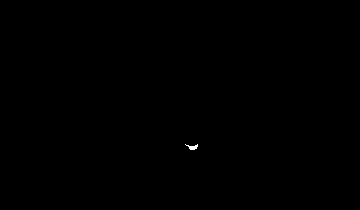

50 180
200 142


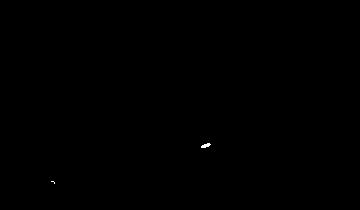

34 185
55 177
211 140


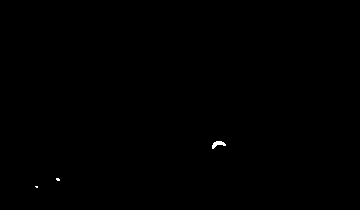

41 182
60 174
223 137


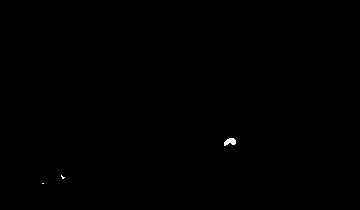

47 179
65 173
236 134


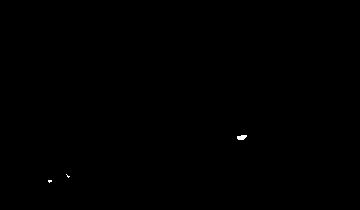

47 179
65 173
236 134


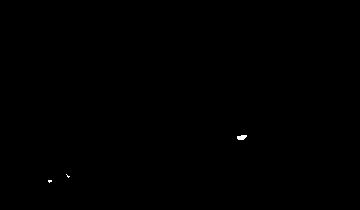

54 177
72 173
247 130


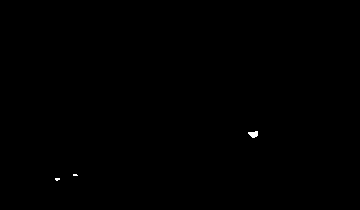

61 173
77 171
259 129


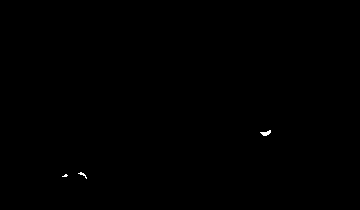

68 169
272 128


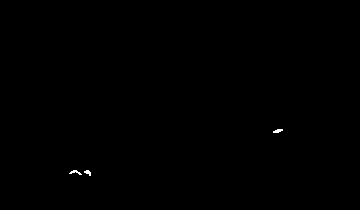

76 164
283 124


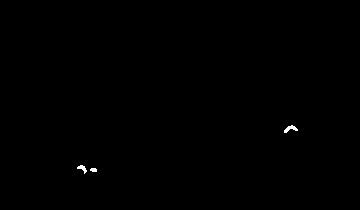

76 164
283 124


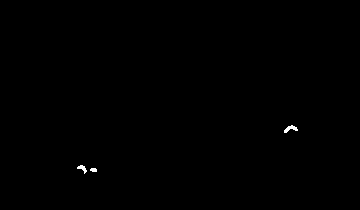

81 161
294 121


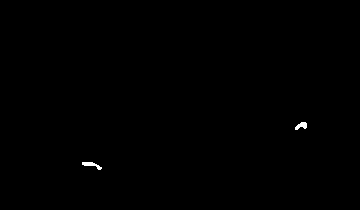

87 155
308 118


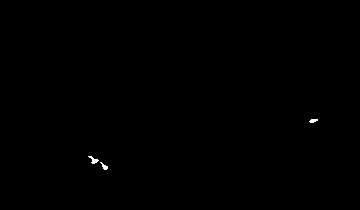

106 164
94 153
319 114


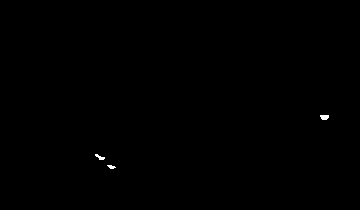

114 163
103 152
328 111


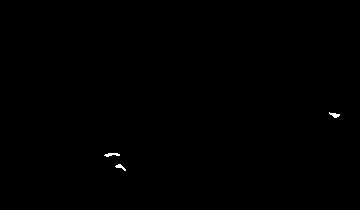

114 163
103 152
328 111


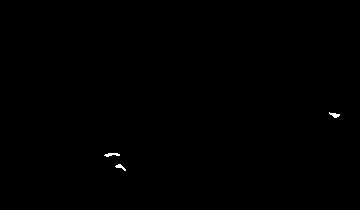

305 186
107 147
0 136
342 110


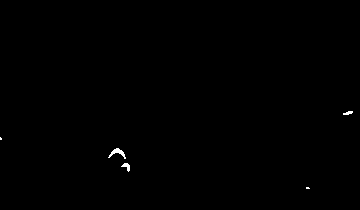

312 184
128 161
115 143
0 135
353 107


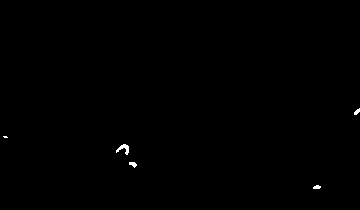

320 182
134 158
125 140


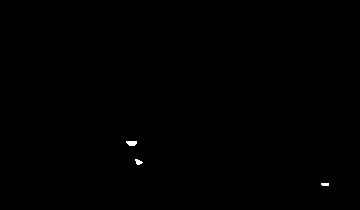

328 177
138 155
129 134
16 132


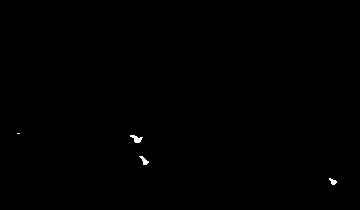

328 177
138 155
129 134
16 132


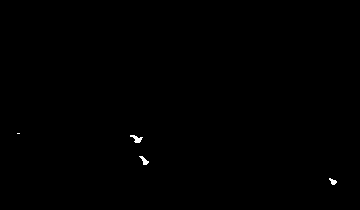

334 176
144 156
133 131
22 130


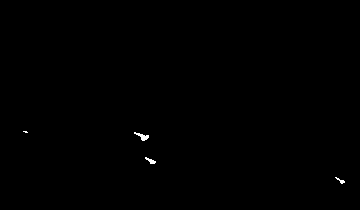

347 178
155 159
146 131
26 128


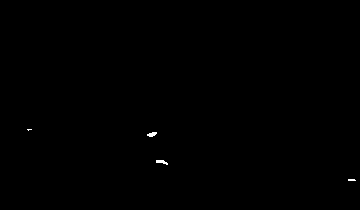

354 176
161 157
149 127
29 124


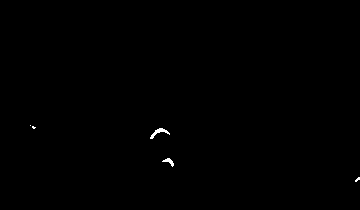

170 155
36 124
157 123


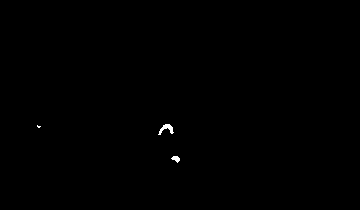

170 155
36 124
157 123


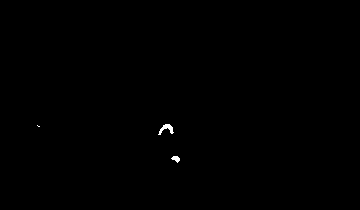

176 152
42 123
166 119


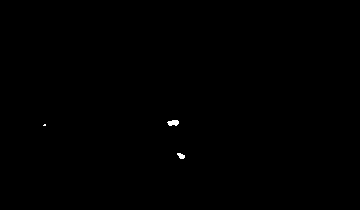

180 149
47 121
169 114


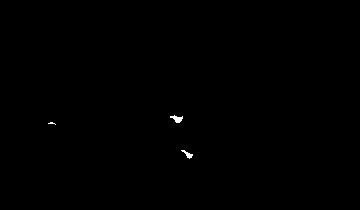

190 152
53 118
173 108


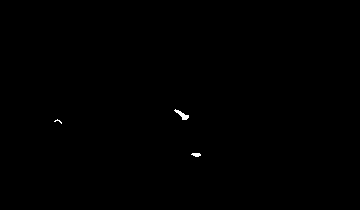

199 151
59 116
180 110


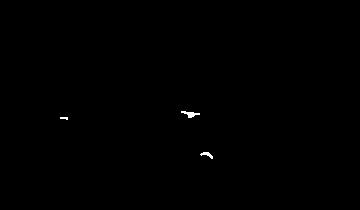

199 151
59 116
180 110


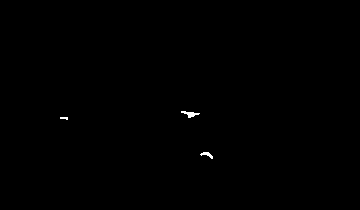

206 149
63 111
190 108


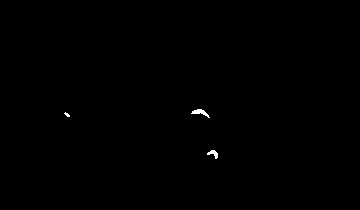

216 147
71 112
197 104


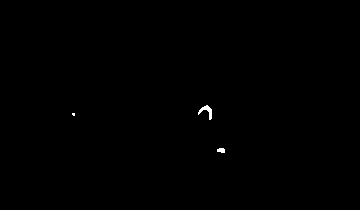

222 144
77 110
206 101


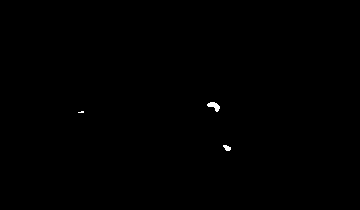

228 140
82 108
210 96


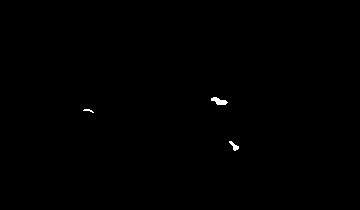

228 140
82 108
210 96


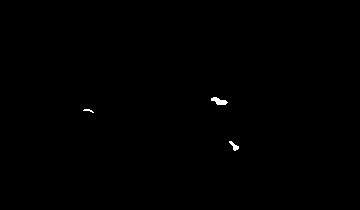

236 142
88 105
218 90


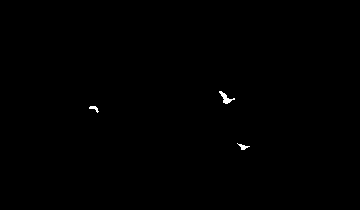

247 144
94 102
223 89


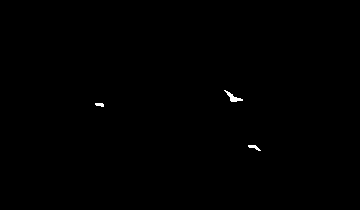

255 142
98 97
234 93


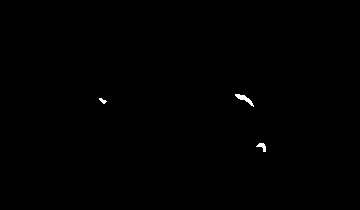

264 140
104 95
241 91


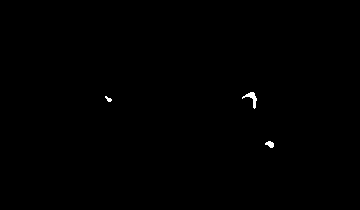

264 140
104 95
241 91


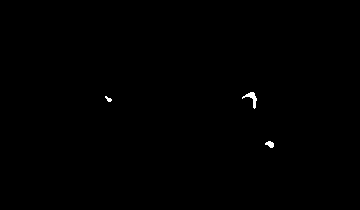

272 139
110 95
251 89


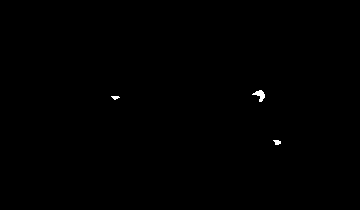

280 135
117 93
260 87


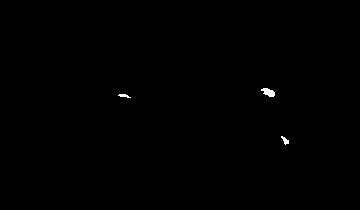

287 135
121 90
268 83


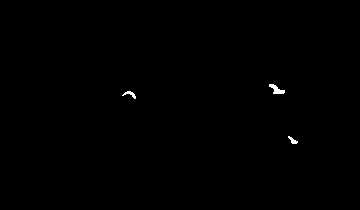

299 139
130 87
277 79


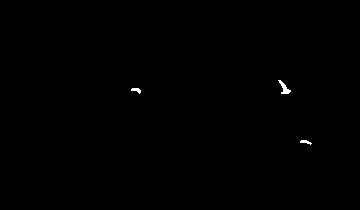

299 139
130 87
277 79


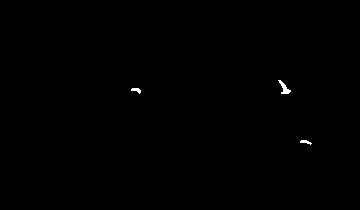

306 138
135 82
282 80


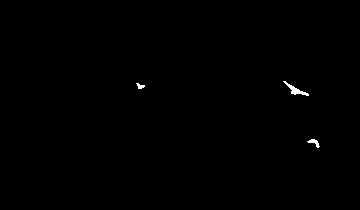

315 137
299 87
139 77


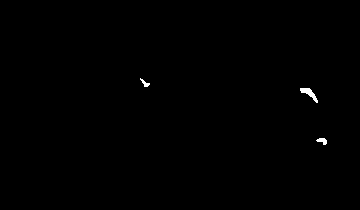

327 135
309 86
145 78


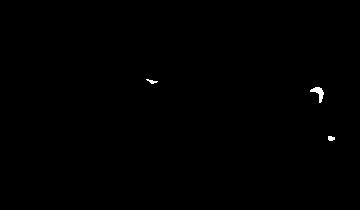

334 132
320 85
154 77


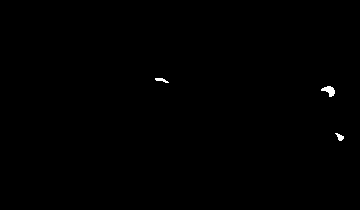

334 132
320 85
154 77


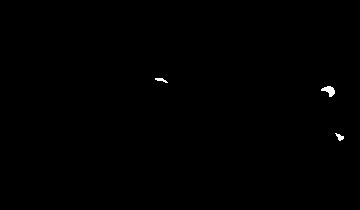

342 133
329 83
160 73


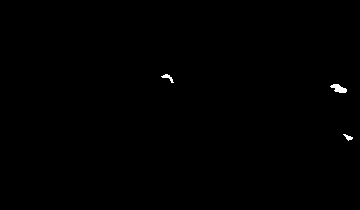

354 135
342 79
169 69


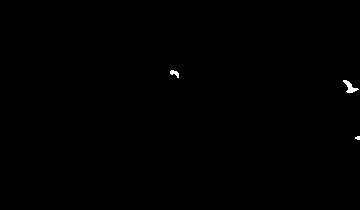

353 76
174 64


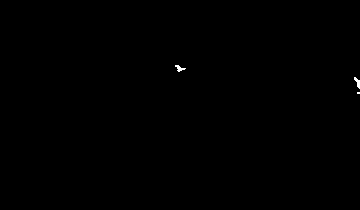

180 59


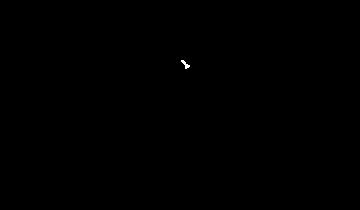

180 59


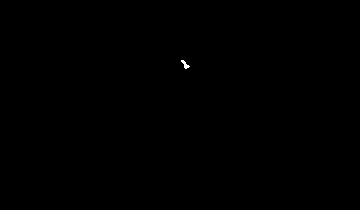

186 58


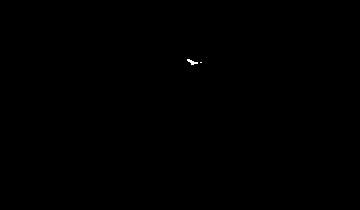

195 57


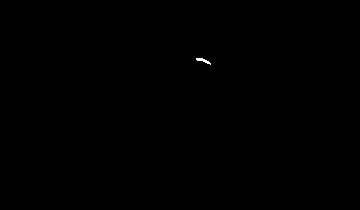

203 53


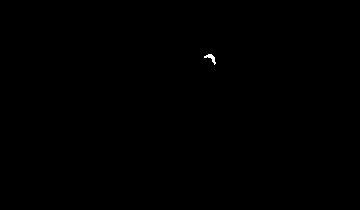

211 49


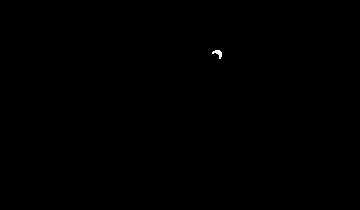

211 49


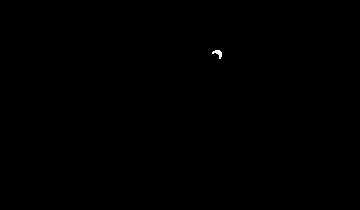

219 44


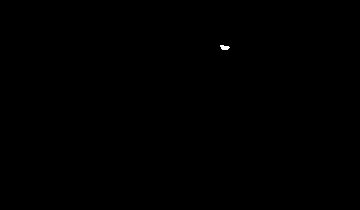

225 37


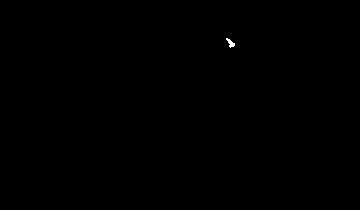

232 35


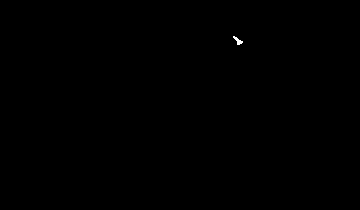

242 36


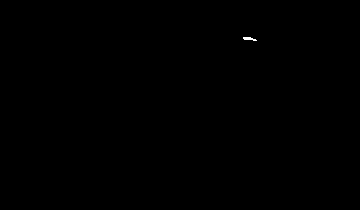

242 36


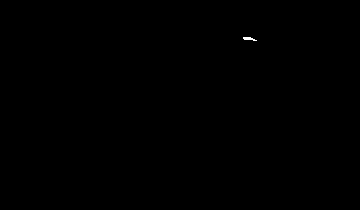

250 32


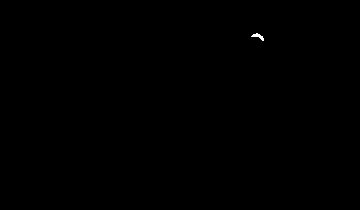

258 28


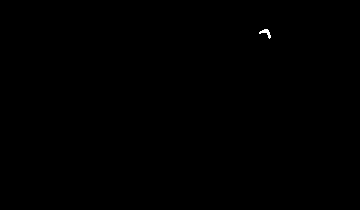

269 24


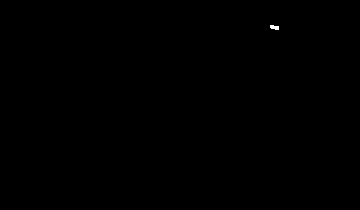

269 24


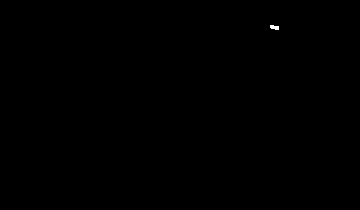

276 18


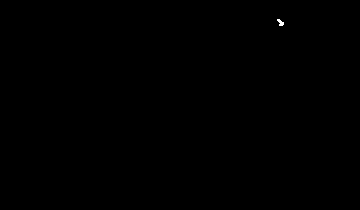

284 15


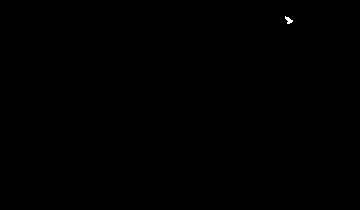

292 15


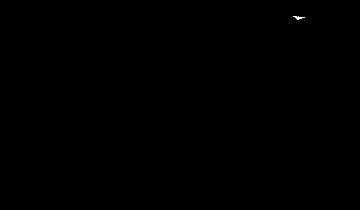

303 12


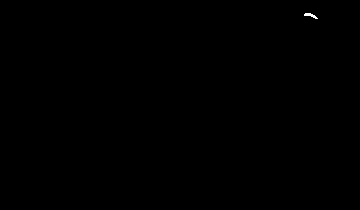

303 12


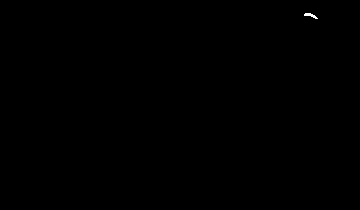

309 8


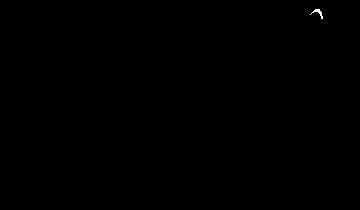

320 4


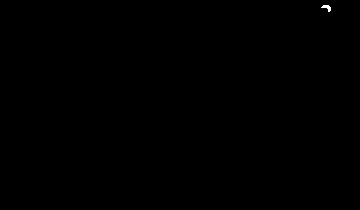

330 0


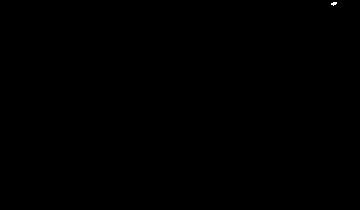

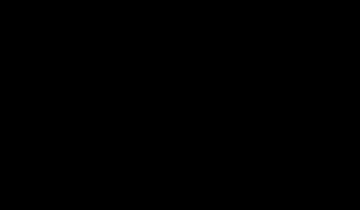

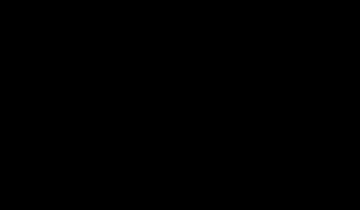

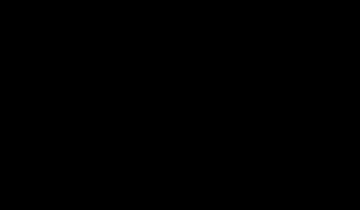

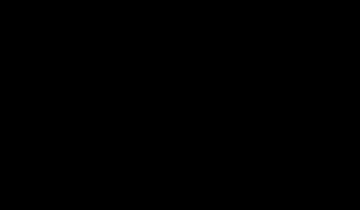

...

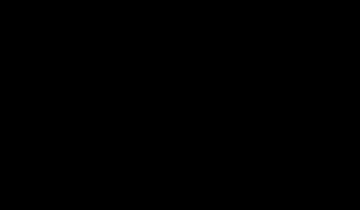

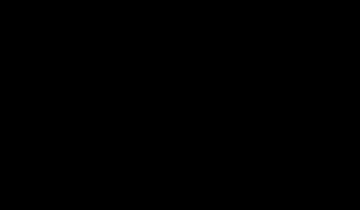

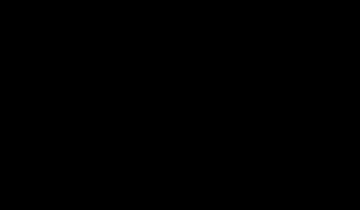

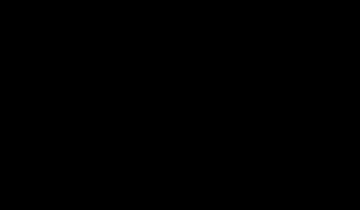

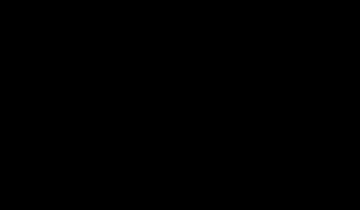

102 188


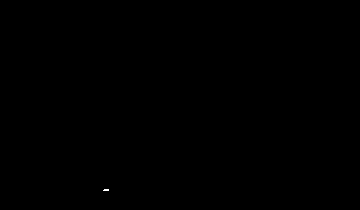

114 185


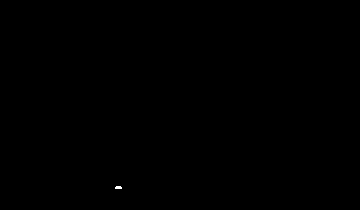

114 185


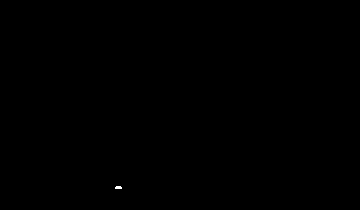

125 182


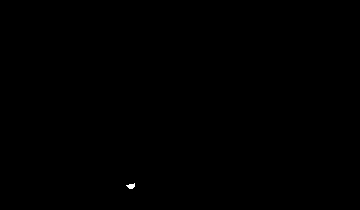

139 183


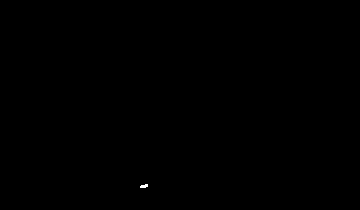

152 181


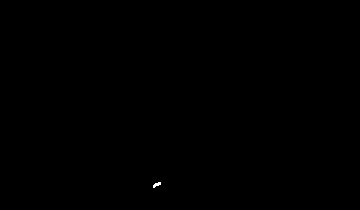

270 186
163 179


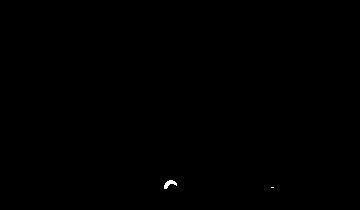

270 186
163 179


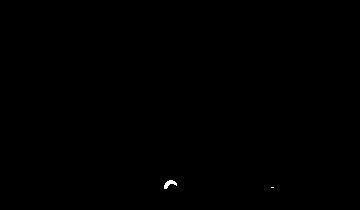

272 182
174 177


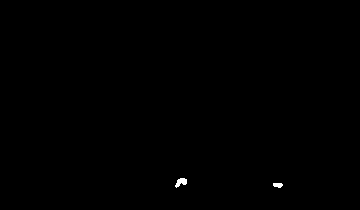

275 175
187 175


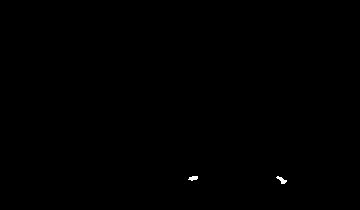

280 174
198 171


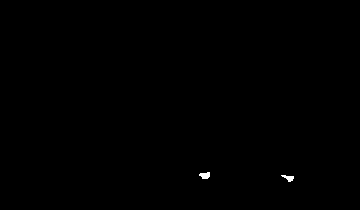

291 172
211 172


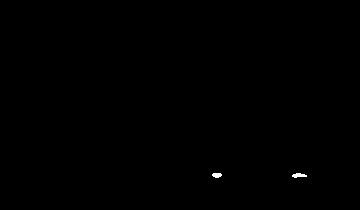

291 172
211 172


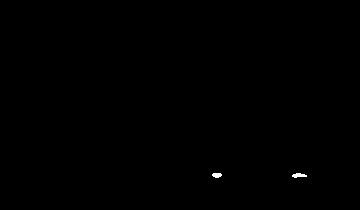

224 171
296 167


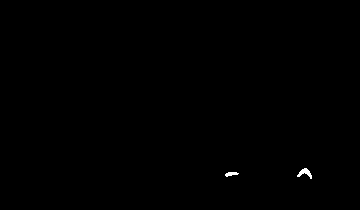

235 169
304 163


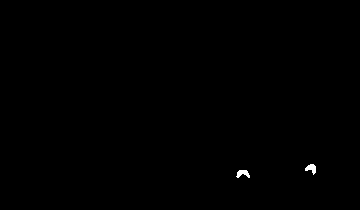

247 166
309 160
0 131


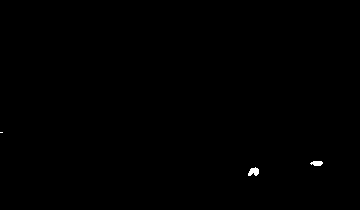

260 165
316 153


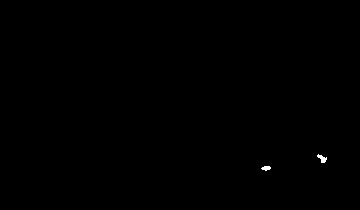

260 165
316 153


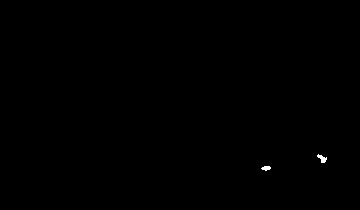

271 163
320 150
10 122


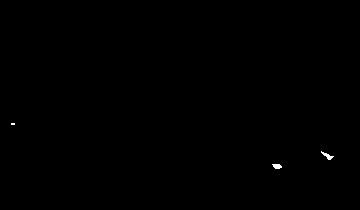

283 163
330 151
15 118


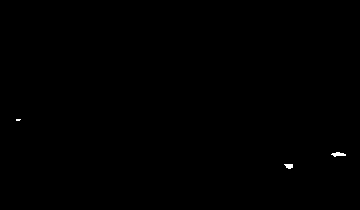

296 162
336 147
21 113


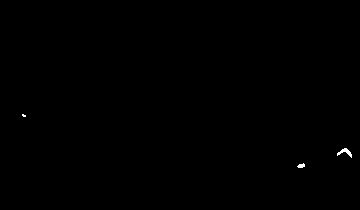

307 161
344 143
28 111


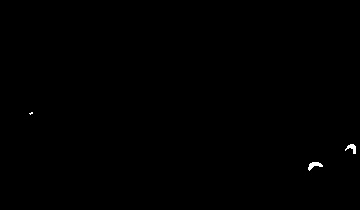

307 161
344 143
28 111


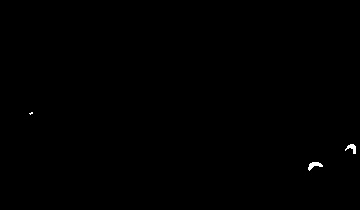

318 160
351 139
35 108


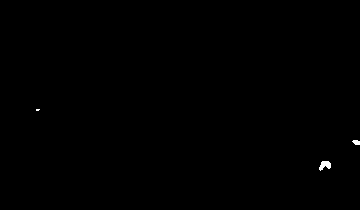

329 158
356 133
40 104


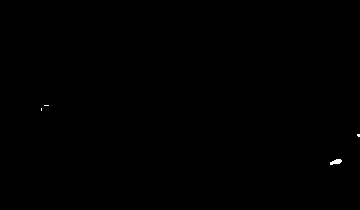

342 157
49 100


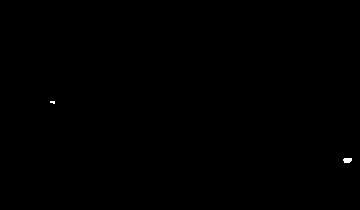

350 156
54 96


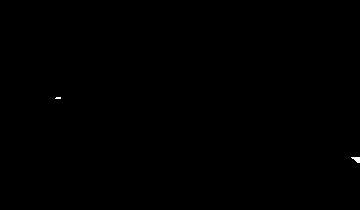

350 156
54 96


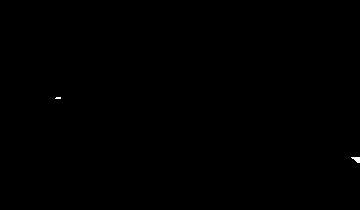

59 92


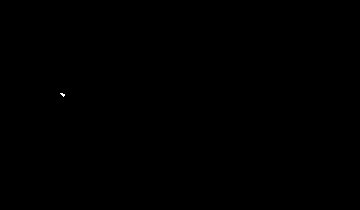

68 91


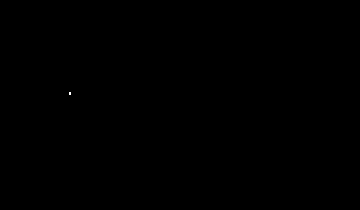

73 89


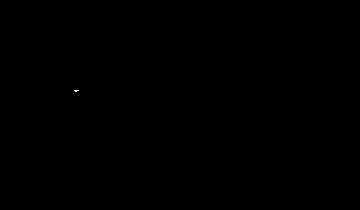

79 85


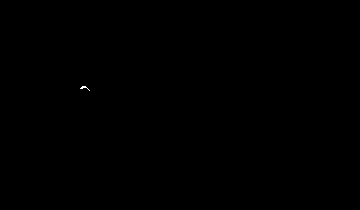

79 85


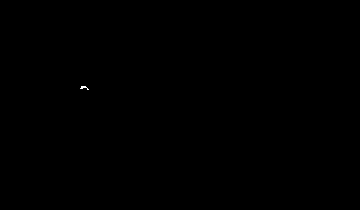

86 82


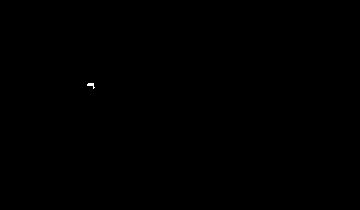

93 79


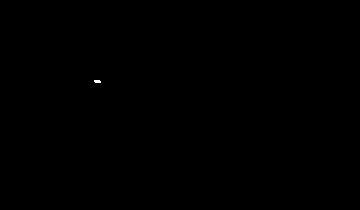

98 73


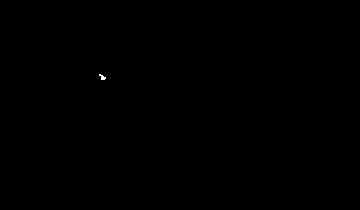

104 71


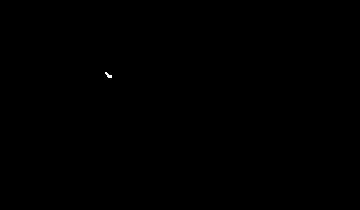

104 71


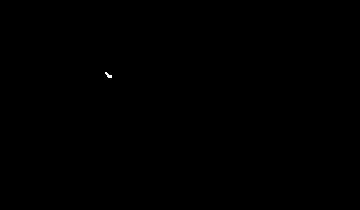

112 72


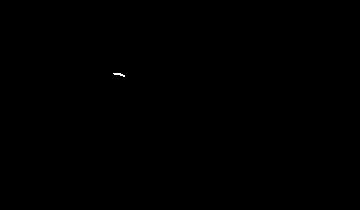

117 69


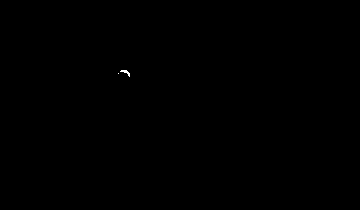

124 65


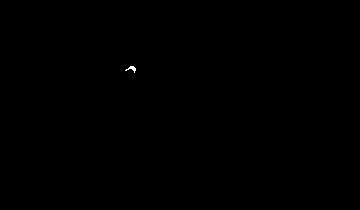

134 62


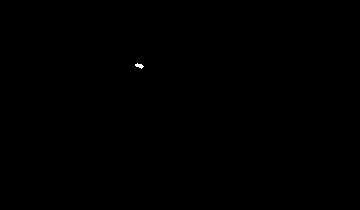

134 62


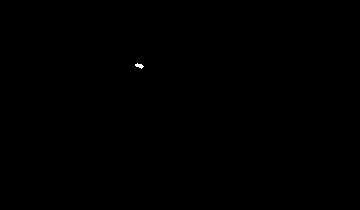

141 59


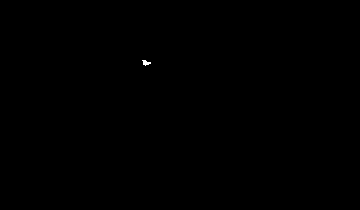

148 56


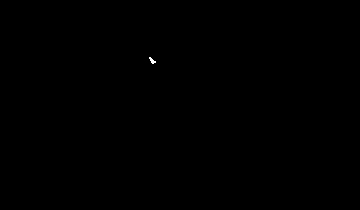

156 58


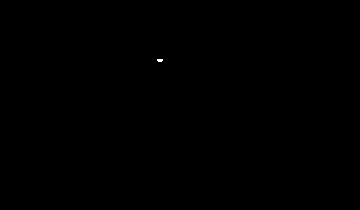

164 56


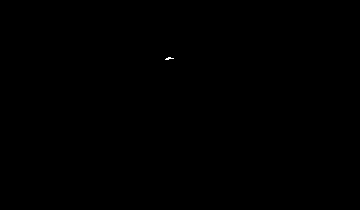

164 56


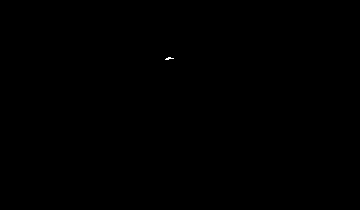

168 54


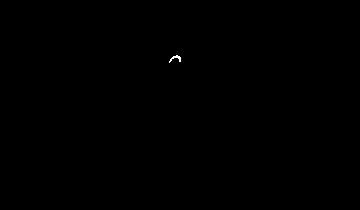

178 52


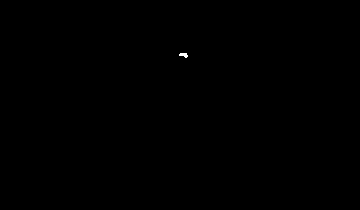

185 50


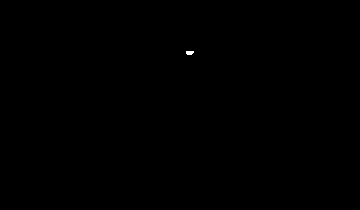

190 46


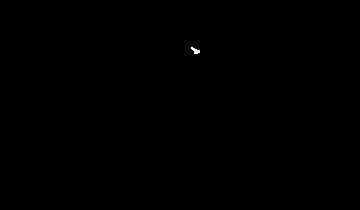

190 46


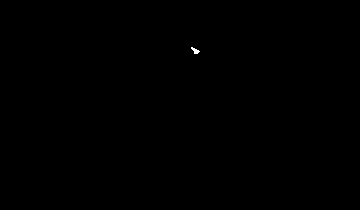

198 47


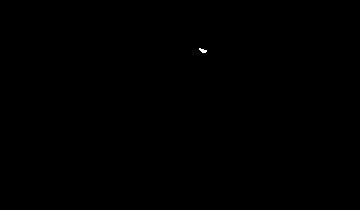

206 47


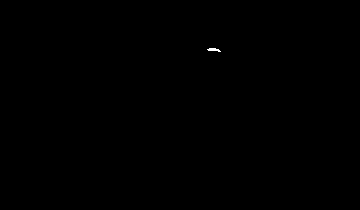

211 45


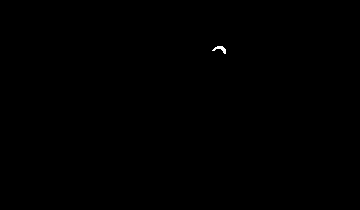

220 43


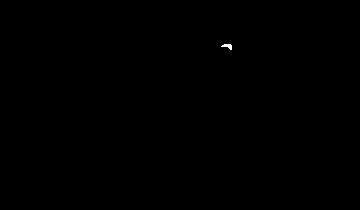

220 43


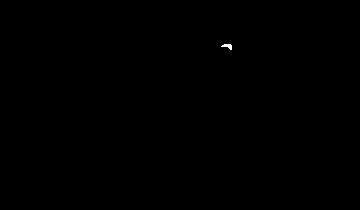

229 40


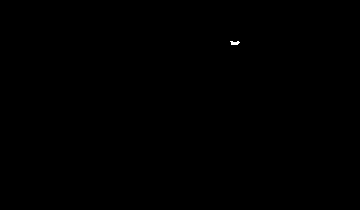

234 36


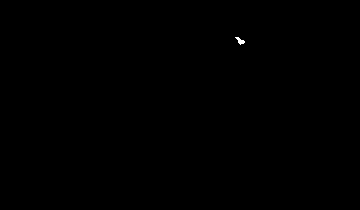

244 38


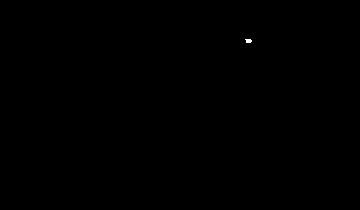

252 37


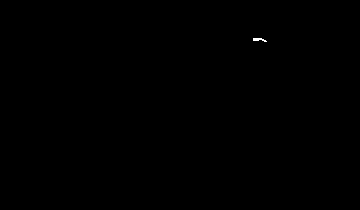

252 37


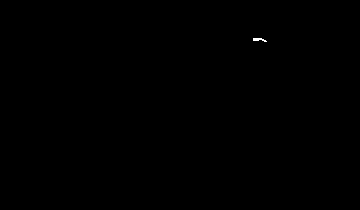

257 34


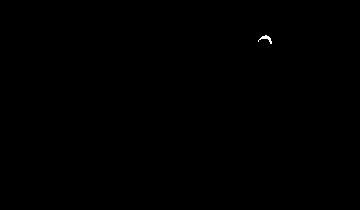

265 32


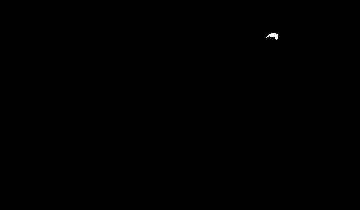

275 29


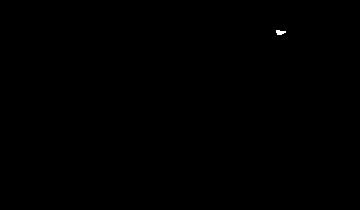

280 24


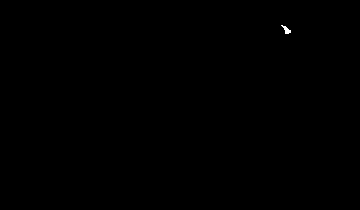

280 24


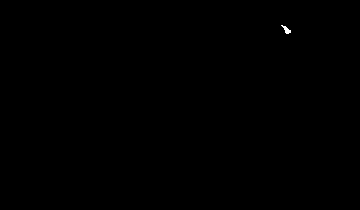

287 24


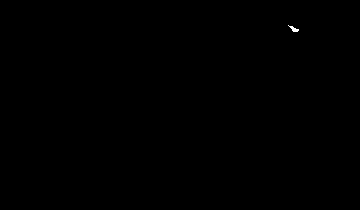

298 26


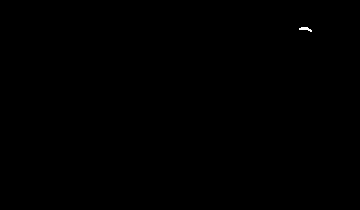

304 24


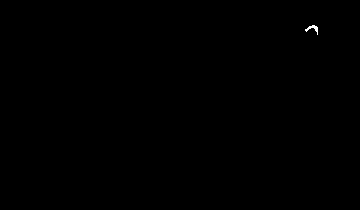

314 22


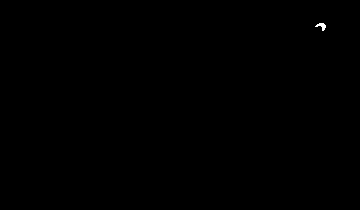

314 22


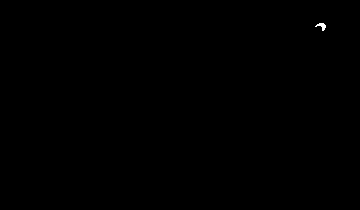

324 19


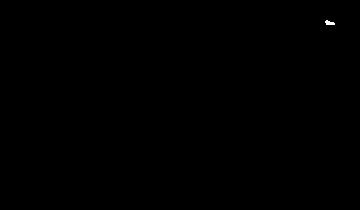

332 15


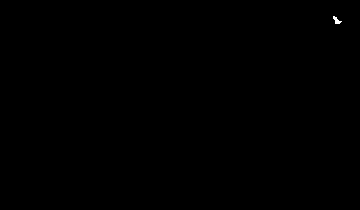

337 13


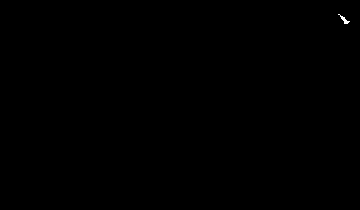

349 18


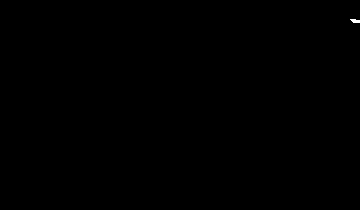

349 18


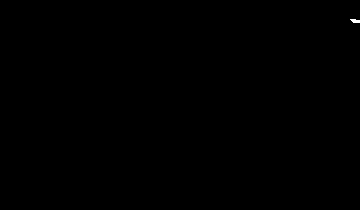

358 20


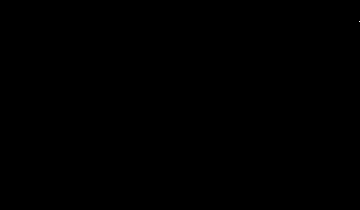

0 170


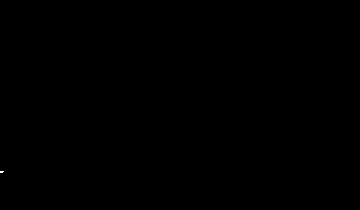

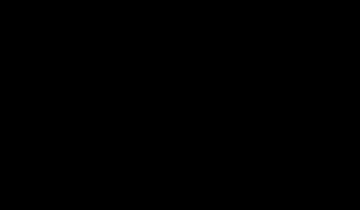

11 165


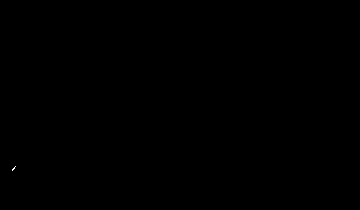

11 165


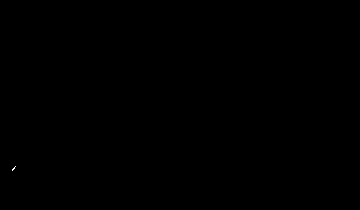

20 161


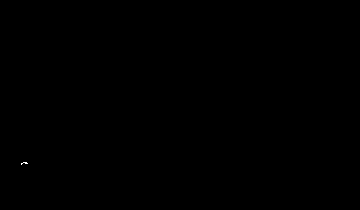

31 157


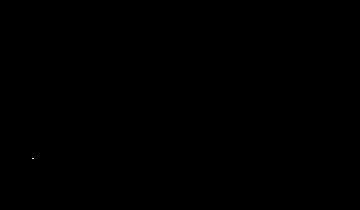

32 153


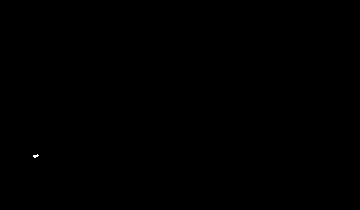

38 152


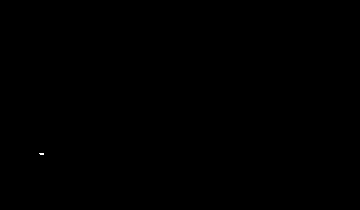

38 152


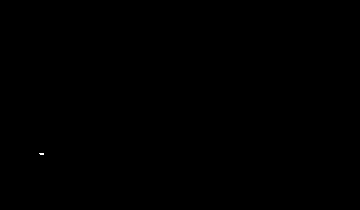

163 190
46 149


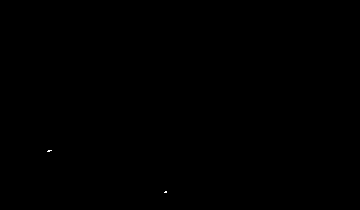

170 186
51 146


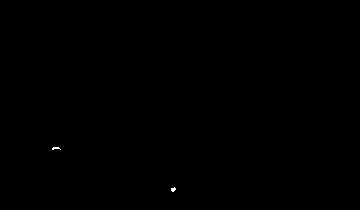

176 185
57 142


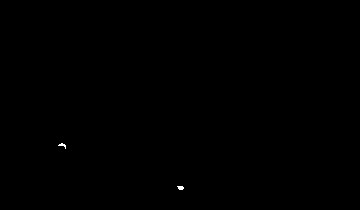

185 183
62 139


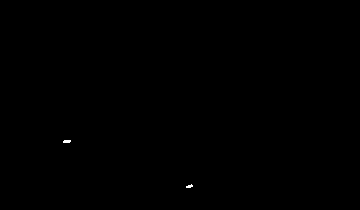

185 183
62 139


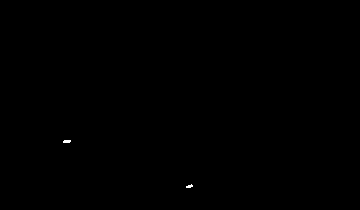

192 180
0 145
65 134


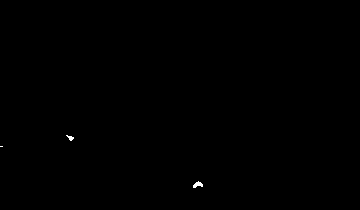

200 178
12 142
70 133


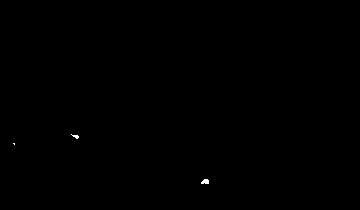

209 176
19 139
79 132


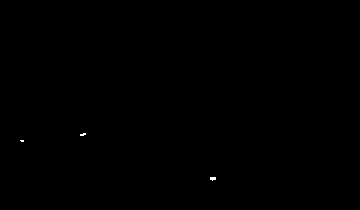

216 173
28 136
81 129


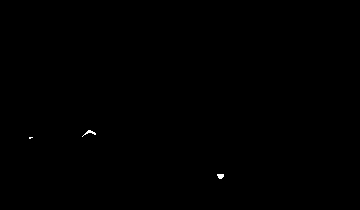

216 173
28 136
81 129


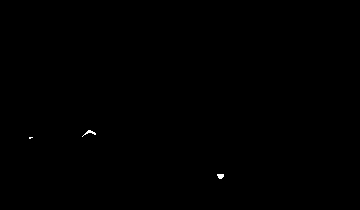

224 172
37 133
88 126


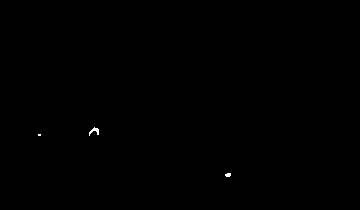

231 170
47 132
96 124


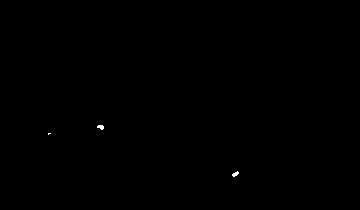

239 169
56 129
100 122


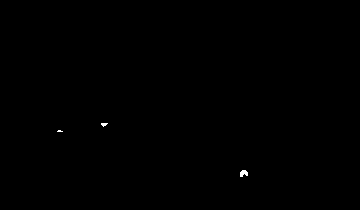

245 167
63 126
104 120


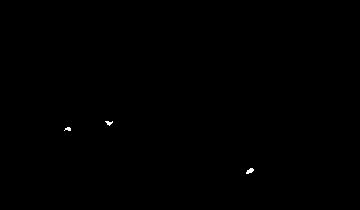

245 167
63 126
104 120


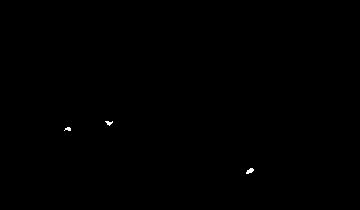

254 166
74 123
110 120


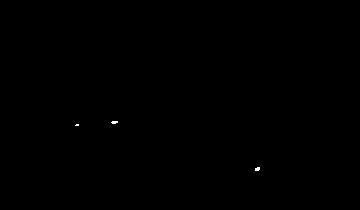

261 166
82 121
116 118


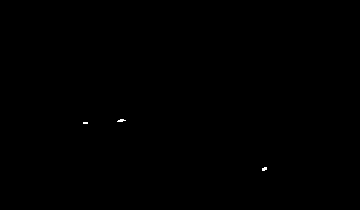

268 166
90 118
119 116


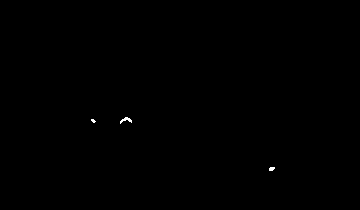

275 164
99 116
123 114


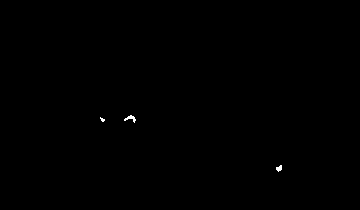

275 164
99 116
123 114


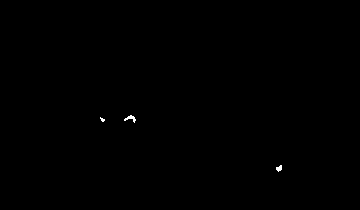

281 167
109 117
130 113


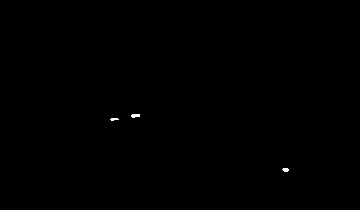

168 198
289 167
118 115
132 110


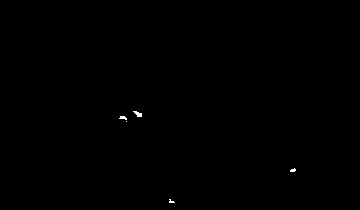

178 198
294 167
127 110


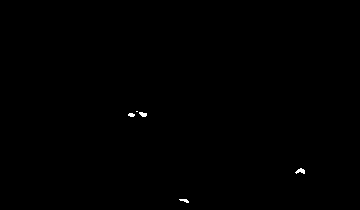

187 196
301 167
135 109


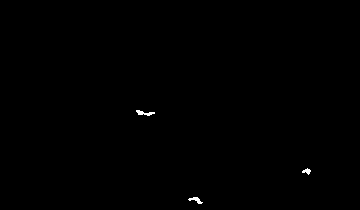

187 196
301 167
136 109


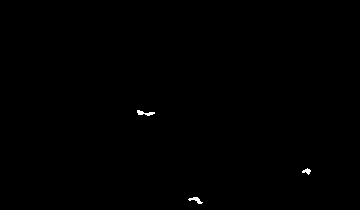

201 193
309 168
143 107


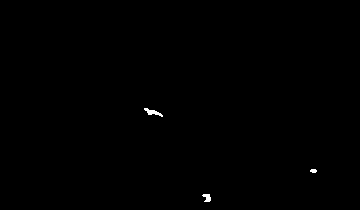

205 199
210 189
315 168
152 107


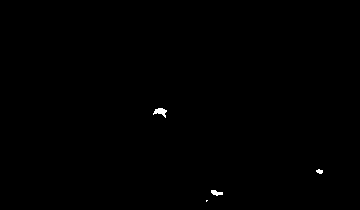

208 199
219 185
322 168
158 104


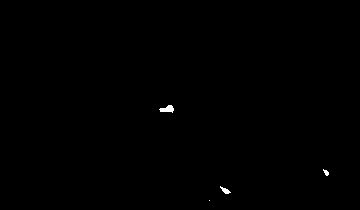

232 189
153 186
328 170
161 101


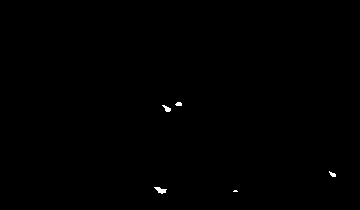

232 189
153 186
328 170
161 101


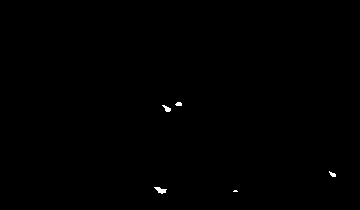

161 183
337 175
164 104
183 98


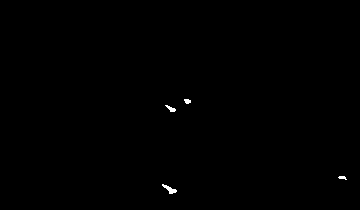

176 187
345 176
170 106
190 95


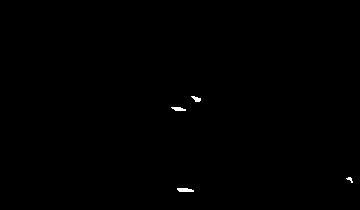

219 193
270 185
186 184
353 177
176 105
203 95


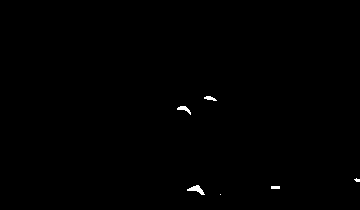

221 192
280 183
197 182
180 103
212 91


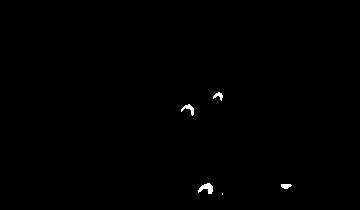

221 192
280 183
197 182
180 103
212 91


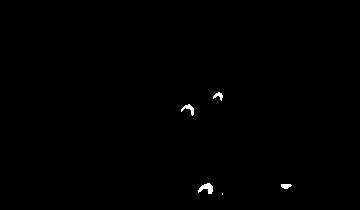

290 181
210 181
188 102
223 88


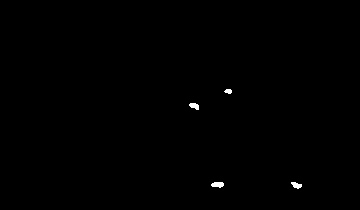

303 183
219 178
190 99
232 85


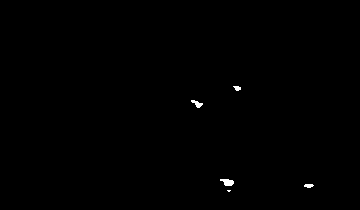

In [14]:
video = imageio.mimread('videopajaros_corto.mp4',memtest=False)  
#video = [resize(frame, (256, 256))[..., :3] for frame in video]    #Size adjustment (if necessary)
HTML(display_video1(video).to_html5_video())  #Inline video display in HTML5